In [2]:
import pdb
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pylab as pylab
import cartopy
import cartopy.crs as ccrs
import pickle as pkl
import glob
from metpy import calc
from metpy.units import units
import matplotlib.patches as patches
from scipy import stats

pylab.rcParams['figure.figsize'] = (50., 50.)
%matplotlib inline

/home/users/cornkle/programs/miniconda3/lib/python3.9/site-packages/pyproj/__init__.py:95: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


In [1]:
cd ..

/home/users/cornkle/pythonWorkspace/proj_CEH


In [2]:
# da_hist = xr.open_dataset(cnst.network_data+'data/LMCS/MCS_files/CP4_box/mean_09_hist.nc')
# da_fut = xr.open_dataset(cnst.network_data+'data/LMCS/MCS_files/CP4_box/mean_09_fut.nc')

In [3]:
def calc_div(da):
    u = units.Quantity(da['u_srfc'].values, 'm/s')
    v = units.Quantity(da['v_srfc'].values, 'm/s')
    
    dx = units.Quantity(4400, 'm')
    div = calc.divergence(u,v, dx=dx, dy=dx)
    # vort = calc.shearing_deformation(u,v, dx, dx)
    da_div = da['sh'].copy(deep=True)
    da_div.values = div
    
    return da_div

In [4]:
def calc_div_mid(da):
    u = units.Quantity(da['u_mid'].values, 'm/s')
    v = units.Quantity(da['v_mid'].values, 'm/s')
    
    dx = units.Quantity(4400, 'm')
    div = calc.divergence(u,v, dx=dx, dy=dx)
    # vort = calc.shearing_deformation(u,v, dx, dx)
    da_div = da['sh'].copy(deep=True)
    da_div.values = div
    
    return da_div

In [5]:
def calc_theta(da):    
    p = units.Quantity(925, 'hPa')
    t = units.Quantity(da['t_srfc'].values+273.15, 'K')
    q = units.Quantity(da['q_srfc'].values/1000, 'kg/kg')
    
    p_up = units.Quantity(650, 'hPa')
    t_up = units.Quantity(da['t_mid'].values+273.15, 'K')
    
    thetaes_up = np.array(calc.saturation_equivalent_potential_temperature(p_up,t_up))
    
    dew = calc.dewpoint_from_specific_humidity(p,t,q)
    thetae_down = np.array(calc.equivalent_potential_temperature(p,t,dew))
     
    thetae = thetae_down #-thetaes_up 
    
    da_theta = da['sh'].copy(deep=True)
    da_theta.values = thetae
    
  #  ipdb.set_trace()
    
    return da_theta

In [6]:
cp4_path = '/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/tables/' #'/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/CP4_box_JASMIN/mean3h_v2/' #instantaneous_18h_v1/'

In [7]:
# da_hist_anom = xr.open_dataset(cp4_path + '/hist_anom_all_18h_2d.nc')
# da_fut_anom = xr.open_dataset(cp4_path + '/fut_anom_all_18h_2d.nc')

da_hist_anom = xr.open_mfdataset(cp4_path + '/anomMean_*_hist.nc', concat_dim='month', combine="nested").load().mean('month')
da_fut_anom = xr.open_mfdataset(cp4_path + '/anomMean_*_fut.nc', concat_dim='month', combine="nested").load().mean('month')

In [8]:
# da_hist = xr.open_dataset(cp4_path + '/hist_mean_all_18h_2d.nc')
# da_fut = xr.open_dataset(cp4_path + '/fut_mean_all_18h_2d.nc')

da_hist = xr.open_mfdataset(cp4_path + '/mean_*_hist.nc', concat_dim='month', combine="nested").load().mean('month')
da_fut = xr.open_mfdataset(cp4_path + '/mean_*_fut.nc', concat_dim='month', combine="nested").load().mean('month')

In [9]:
clim_hist = da_hist-da_hist_anom
clim_fut = da_fut-da_fut_anom

In [10]:
old_path = '/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/CP4_box_anom/CP4_allHours_historical_5000km2_-50_WAf_box_anom_v2'

In [11]:
files = glob.glob(old_path+'/*.nc')

In [12]:
list(da_hist.keys())

['lw_out_PBLtop',
 'lsRain',
 'shear',
 'u_mid',
 'u_srfc',
 'v_mid',
 'v_srfc',
 'q_mid',
 't_mid',
 't_srfc',
 'q_srfc',
 'geoH_srfc',
 'tcwv',
 'sh',
 'lh',
 't2',
 'q2',
 'lsRain_noon',
 'lwout_noon',
 'SM']

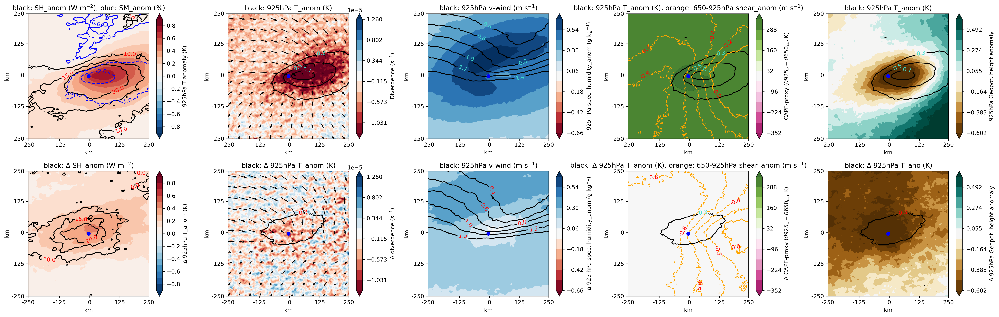

In [24]:
f = plt.figure(figsize=(25,8), dpi=300)
mname = 'node'
extent = 57 #* 4.4

ticks = np.array([0,58-57/2,58,58+57/2,114])
#labels = np.rint([-57*4.4,-57/2*4.4,0,57/2*4.4, 57*4.4])
labels = [-250,-125,0,125,250]

ax = f.add_subplot(2,5,1)

#ano = da_hist_anom['t2']#.mean('cases')
cont =da_hist_anom['sh']
cont2 = da_hist_anom['SM']
ano = da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='RdBu_r', extend='both', levels=np.arange(-0.9,0.91,0.1)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='925hPa T anomaly (K)')
plt.title('black: SH_anom (W m$^{-2}$), blue: SM_anom (%)')
cm = ax.contour(cont, colors='k', levels=[-20,-15,-10,0,10,15,20], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')

cm = ax.contour(cont2, colors='blue', levels=[-2,-1,0,1,2], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='blue')

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(2,5,2)

cont = da_hist_anom['t_srfc']
ano_div = calc_div(da_hist)
thresh = np.max(np.abs(np.percentile(ano_div, [5, 95])))

plt.contourf(ano_div, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='Divergence (s$^{-1}$)')
plt.title('black: 925hPa T_anom (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')

pv, pw = da_hist_anom['u_srfc'].values, da_hist_anom['v_srfc'].values
qv = plt.quiver(np.arange(da_hist.longitude.shape[0])[::10], np.arange(da_hist.latitude.shape[0])[::10], pv[::10,::10], pw[::10,::10])

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(2,5,3)
ano = da_hist_anom['q_srfc']
cont = da_hist['v_srfc']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='925 hPa spec. humidity_anom (g kg$^{-1}$)')
plt.title('black: 925hPa v-wind (m s$^{-1}$)')
cm = ax.contour(cont, colors='k', levels=[-1.4,-1.2,-1, -0.8, -0.6,-0.4,0,0.4,0.6,0.8,1,1.2,1.4], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)


ax = f.add_subplot(2,5,4)
ano = calc_theta(da_hist)
cont = da_hist_anom['t_srfc']
cont2 = da_hist_anom['shear']

thresh_th = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='PiYG', extend='both', levels=np.linspace(thresh_th*-1, thresh_th, 12), alpha=0.9) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label=r'CAPE-proxy ($\theta925 _{e}-\theta650 _{es}$, K)')
plt.title('black: 925hPa T_anom (K), orange: 650-925hPa shear_anom (m s$^{-1}$)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')
cm = ax.contour(cont2, colors='orange', levels=[-0.8,-0.6 ,-0.4,-0.2,0], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='red')


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)



ax = f.add_subplot(2,5,5)
ano = da_hist_anom['geoH_srfc']#*10
cont = da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='BrBG', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label=r'925hPa Geopot. height anomaly')
plt.title('black: 925hPa T_anom (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)



###############################################

ax = f.add_subplot(2,5,6)

#ano = da_hist_anom['t2']#.mean('cases')
cont =da_fut_anom['sh']-da_hist_anom['sh']

ano = da_fut_anom['t_srfc']-da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='RdBu_r', extend='both', levels=np.arange(-0.9,0.91,0.1))  #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='$\Delta$ 925hPa T_anom (K)')
plt.title('black: $\Delta$ SH_anom (W m$^{-2}$)')
cm = ax.contour(cont, colors='k', levels=[-20,-15,-10,0, 10,15,20], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(2,5,7)

ano = calc_div(da_hist)
anofut = calc_div(da_fut)
ano = anofut-ano
cont = da_fut_anom['t_srfc']-da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano_div, [5, 95])))

plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='$\Delta$ divergence (s$^{-1}$)')
plt.title('black: $\Delta$ 925hPa T_anom (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9,-0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')

pv, pw = da_fut_anom['u_srfc'].values-da_hist_anom['u_srfc'].values, da_fut_anom['v_srfc'].values-da_hist_anom['v_srfc'].values
qv = plt.quiver(np.arange(da_hist.longitude.shape[0])[::10], np.arange(da_hist.latitude.shape[0])[::10], pv[::10,::10], pw[::10,::10])

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(2,5,8)
pano = da_hist_anom['q_srfc']
ano = da_fut_anom['q_srfc']-da_hist_anom['q_srfc']
cont = da_fut['v_srfc']

thresh = np.max(np.abs(np.percentile(pano, [5, 95])))

plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='$\Delta$ 925 hPa spec. humidity_anom (g kg$^{-1}$)')
plt.title('black: 925hPa v-wind (m s$^{-1}$)')
cm = ax.contour(cont, colors='k', levels=[-1.4,-1.2,-1, -0.8, -0.6,-0.4,0,0.4,0.6,0.8,1,1.2,1.4], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)


ax = f.add_subplot(2,5,9)
ano = calc_theta(da_hist)
anofut = calc_theta(da_fut)
ano = anofut-ano
cont = da_fut_anom['t_srfc']-da_hist_anom['t_srfc']
cont2 = da_fut_anom['shear']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='PiYG', extend='both', levels=np.linspace(thresh_th*-1, thresh_th, 12), alpha=0.9) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label=r'$\Delta$ CAPE-proxy ($\theta925 _{e}-\theta650 _{es}$, K)')
plt.title('black: $\Delta$ 925hPa T_anom (K), orange: 650-925hPa shear_anom (m s$^{-1}$)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')
cm = ax.contour(cont2, colors='orange', levels=[-0.8,-0.6 ,-0.4,-0.2,0], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='red')


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)



ax = f.add_subplot(2,5,10)
pano = da_hist_anom['geoH_srfc']
ano = (da_fut_anom['geoH_srfc']-da_hist_anom['geoH_srfc'])#*10
cont = da_fut_anom['t_srfc']-da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(pano, [5, 95])))

plt.contourf(ano, cmap='BrBG', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label=r'$\Delta$ 925hPa Geopot. height anomaly')
plt.title('black: $\Delta$ 925hPa T_ano (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)



plt.tight_layout()
#f.savefig(cnst.network_data + 'figs/LMCS/CP4_PNASstudy/composites_hist_fut_tcwv.jpg')

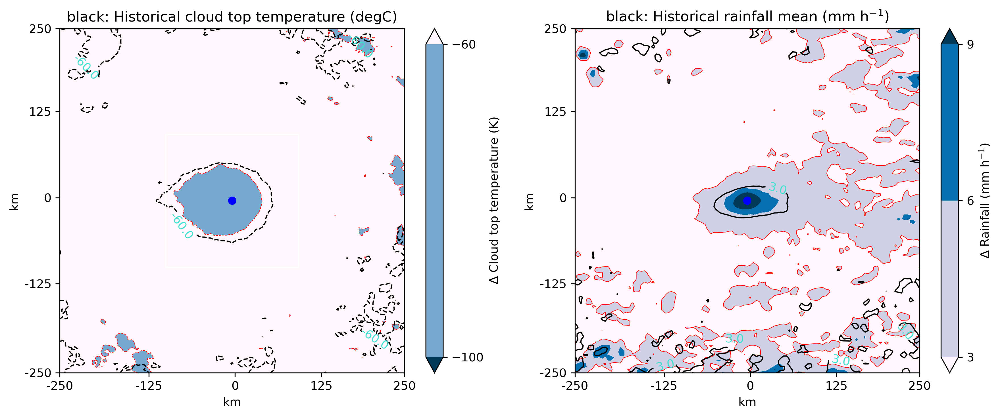

In [23]:
f = plt.figure(figsize=(12,5), dpi=300)
mname = 'node'
extent = 57 #* 4.4

ticks = np.array([0,58-57/2,58,58+57/2,114])
#labels = np.rint([-57*4.4,-57/2*4.4,0,57/2*4.4, 57*4.4])
labels = [-250,-125,0,125,250]
box = [57-22, 57+22, 57-22, 57+22]

ax = f.add_subplot(1,2,1)

ano =da_fut['lw_out_PBLtop']#-da_hist['lw_out_PBLtop']
cont = da_hist['lw_out_PBLtop']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='PuBu_r', extend='both', levels=[-100,-60]) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='$\Delta$ Cloud top temperature (K)')
cm = ax.contour(ano, colors='r', levels=[-100,-60], linewidths=0.5)
plt.title('black: Historical cloud top temperature (degC)')
cm = ax.contour(cont, colors='k', levels=[-100,-60], linewidths=1)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')
rect2 = patches.Rectangle((box[0],box[2]),box[1]-box[0],box[3]-box[2],linewidth=0.8,edgecolor='w',facecolor='none', zorder=99)
ax.add_patch(rect2)

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(1,2,2)
ano =da_fut['lsRain']#-da_hist['lsRain'])
cont = da_hist['lsRain']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='PuBu', extend='both', levels=[3,6,9])
plt.colorbar(label='$\Delta$ Rainfall (mm h$^{-1}$)')
plt.contour(ano, colors='red', levels=[-5,3], linewidths=0.5)#levels=np.linspace(thresh * -1, thresh, 10)

plt.title('black: Historical rainfall mean (mm h$^{-1}$)')
cm = ax.contour(cont, colors='k', levels=[-5, 3], linewidths=1)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')

# pv, pw = da_hist_anom['u_srfc'].values, da_hist_anom['v_srfc'].values
# qv = plt.quiver(np.arange(da_hist.longitude.shape[0])[::10], np.arange(da_hist.latitude.shape[0])[::10], pv[::10,::10], pw[::10,::10])

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

plt.tight_layout()

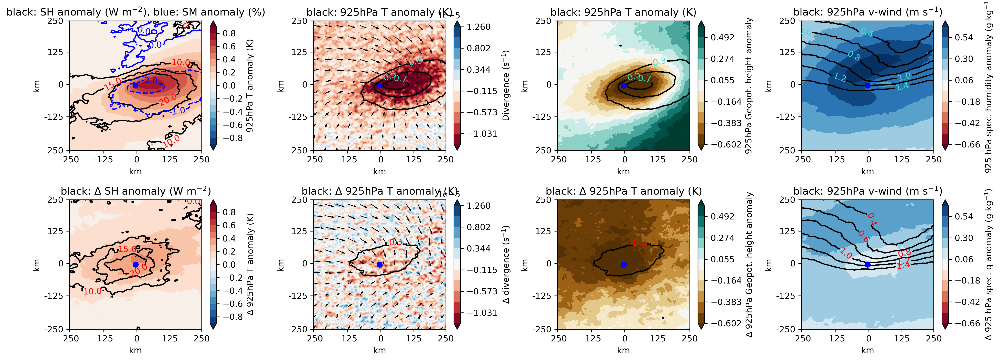

In [25]:
f = plt.figure(figsize=(16,6), dpi=300)
mname = 'node'
extent = 57 #* 4.4

ticks = np.array([0,58-57/2,58,58+57/2,114])
#labels = np.rint([-57*4.4,-57/2*4.4,0,57/2*4.4, 57*4.4])
labels = [-250,-125,0,125,250]

ax = f.add_subplot(2,4,1)

#ano = da_hist_anom['t2']#.mean('cases')
cont =da_hist_anom['sh']
cont2 = da_hist_anom['SM']
ano = da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='RdBu_r', extend='both', levels=np.arange(-0.9,0.91,0.1)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='925hPa T anomaly (K)')
plt.title('black: SH anomaly (W m$^{-2}$), blue: SM anomaly (%)')
cm = ax.contour(cont, colors='k', levels=[-20,-15,-10,0,10,15,20], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')

cm = ax.contour(cont2, colors='blue', levels=[-2,-1,0,1,2], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='blue')

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(2,4,2)
ano_div = calc_div(da_hist)
cont = da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano_div, [5, 95])))

plt.contourf(ano_div, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='Divergence (s$^{-1}$)')
plt.title('black: 925hPa T anomaly (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')

pv, pw = da_hist_anom['u_srfc'].values, da_hist_anom['v_srfc'].values
qv = plt.quiver(np.arange(da_hist.longitude.shape[0])[::10], np.arange(da_hist.latitude.shape[0])[::10], pv[::10,::10], pw[::10,::10])

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(2,4,4)
ano = da_hist_anom['q_srfc']
cont = da_hist['v_srfc']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='925 hPa spec. humidity anomaly (g kg$^{-1}$)')
plt.title('black: 925hPa v-wind (m s$^{-1}$)')
cm = ax.contour(cont, colors='k', levels=[-1.4,-1.2,-1, -0.8, -0.6,-0.4,0,0.4,0.6,0.8,1,1.2,1.4], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)




ax = f.add_subplot(2,4,3)
ano = da_hist_anom['geoH_srfc']#*10
cont = da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='BrBG', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label=r'925hPa Geopot. height anomaly')
plt.title('black: 925hPa T anomaly (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)



###############################################

ax = f.add_subplot(2,4,5)

#ano = da_hist_anom['t2']#.mean('cases')
cont =da_fut_anom['sh']-da_hist_anom['sh']

ano = da_fut_anom['t_srfc']-da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='RdBu_r', extend='both', levels=np.arange(-0.9,0.91,0.1))  #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='$\Delta$ 925hPa T anomaly (K)')
plt.title('black: $\Delta$ SH anomaly (W m$^{-2}$)')
cm = ax.contour(cont, colors='k', levels=[-20,-15,-10,0, 10,15,20], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(2,4,6)

ano = calc_div(da_hist)
anofut = calc_div(da_fut)
ano = anofut-ano
cont = da_fut_anom['t_srfc']-da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano_div, [5, 95])))

plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='$\Delta$ divergence (s$^{-1}$)')
plt.title('black: $\Delta$ 925hPa T anomaly (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9,-0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')

pv, pw = da_fut_anom['u_srfc'].values-da_hist_anom['u_srfc'].values, da_fut_anom['v_srfc'].values-da_hist_anom['v_srfc'].values
qv = plt.quiver(np.arange(da_hist.longitude.shape[0])[::10], np.arange(da_hist.latitude.shape[0])[::10], pv[::10,::10], pw[::10,::10])

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(2,4,8)
pano = da_hist_anom['q_srfc']
ano = da_fut_anom['q_srfc']-da_hist_anom['q_srfc']
cont = da_fut['v_srfc']

thresh = np.max(np.abs(np.percentile(pano, [5, 95])))

plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='$\Delta$ 925 hPa spec. q anomaly (g kg$^{-1}$)')
plt.title('black: 925hPa v-wind (m s$^{-1}$)')
cm = ax.contour(cont, colors='k', levels=[-1.4,-1.2,-1, -0.8, -0.6,-0.4,0,0.4,0.6,0.8,1,1.2,1.4], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)


ax = f.add_subplot(2,4,7)
pano = da_hist_anom['geoH_srfc']
ano = (da_fut_anom['geoH_srfc']-da_hist_anom['geoH_srfc'])#*10
cont = da_fut_anom['t_srfc']-da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(pano, [5, 95])))

plt.contourf(ano, cmap='BrBG', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label=r'$\Delta$ 925hPa Geopot. height anomaly')
plt.title('black: $\Delta$ 925hPa T anomaly (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)



plt.tight_layout()
#f.savefig(cnst.network_data + 'figs/LMCS/CP4_PNASstudy/composites_hist_fut_poster.jpg')

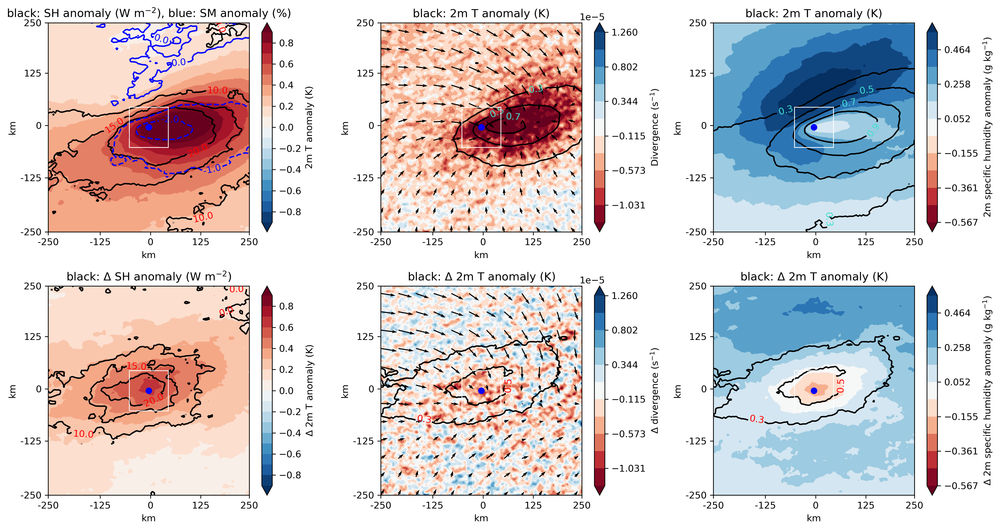

In [27]:
f = plt.figure(figsize=(15,8), dpi=300)
mname = 'node'
extent = 57 #* 4.4

ticks = np.array([0,58-57/2,58,58+57/2,114])
#labels = np.rint([-57*4.4,-57/2*4.4,0,57/2*4.4, 57*4.4])
labels = [-250,-125,0,125,250]
mid=57
dist = 11
box = [mid-dist, mid+dist,mid-dist, mid+dist]

ax = f.add_subplot(2,3,1)

#ano = da_hist_anom['t2']#.mean('cases')
cont =da_hist_anom['sh']
cont2 = da_hist_anom['SM']
ano = da_hist_anom['t2']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='RdBu_r', extend='both', levels=np.arange(-0.9,0.91,0.1)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='2m T anomaly (K)')
plt.title('black: SH anomaly (W m$^{-2}$), blue: SM anomaly (%)')
cm = ax.contour(cont, colors='k', levels=[-20,-15,-10,0,10,15,20], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')

cm = ax.contour(cont2, colors='blue', levels=[-2,-1,0,1,2], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='blue')
rect2 = patches.Rectangle((box[0],box[2]),box[1]-box[0],box[3]-box[2],linewidth=0.8,edgecolor='w',facecolor='none', zorder=99)
ax.add_patch(rect2)

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

ax = f.add_subplot(2,3,2)
ano_div = calc_div(da_hist)
cont = da_hist_anom['t_srfc']

thresh = np.max(np.abs(np.percentile(ano_div, [5, 95])))

plt.contourf(ano_div, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='Divergence (s$^{-1}$)')
plt.title('black: 2m T anomaly (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')
rect2 = patches.Rectangle((box[0],box[2]),box[1]-box[0],box[3]-box[2],linewidth=0.8,edgecolor='w',facecolor='none', zorder=99)
ax.add_patch(rect2)

pv, pw = da_hist_anom['u_srfc'].values, da_hist_anom['v_srfc'].values
qv = plt.quiver(np.arange(da_hist.longitude.shape[0])[::10], np.arange(da_hist.latitude.shape[0])[::10], pv[::10,::10], pw[::10,::10])

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)


ax = f.add_subplot(2,3,3)
ano = da_hist_anom['q2']*1000
cont = da_hist_anom['t2']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label=r'2m specific humidity anomaly (g kg$^{-1}$)')
plt.title('black: 2m T anomaly (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')
rect2 = patches.Rectangle((box[0],box[2]),box[1]-box[0],box[3]-box[2],linewidth=0.8,edgecolor='w',facecolor='none', zorder=99)
ax.add_patch(rect2)


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)



###############################################

ax = f.add_subplot(2,3,4)

#ano = da_hist_anom['t2']#.mean('cases')
cont =da_fut_anom['sh']-da_hist_anom['sh']

ano = da_fut_anom['t2']-da_hist_anom['t2']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(ano, cmap='RdBu_r', extend='both', levels=np.arange(-0.9,0.91,0.1))  #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='$\Delta$ 2m T anomaly (K)')
plt.title('black: $\Delta$ SH anomaly (W m$^{-2}$)')
cm = ax.contour(cont, colors='k', levels=[-20,-15,-10,0, 10,15,20], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')
rect2 = patches.Rectangle((box[0],box[2]),box[1]-box[0],box[3]-box[2],linewidth=0.8,edgecolor='w',facecolor='none', zorder=99)
ax.add_patch(rect2)


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)


ax = f.add_subplot(2,3,5)

ano = calc_div(da_hist)
anofut = calc_div(da_fut)
ano = anofut-ano
cont = da_fut_anom['t2']-da_hist_anom['t2']

thresh = np.max(np.abs(np.percentile(ano_div, [5, 95])))

plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label='$\Delta$ divergence (s$^{-1}$)')
plt.title('black: $\Delta$ 2m T anomaly (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9,-0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')
rect2 = patches.Rectangle((box[0],box[2]),box[1]-box[0],box[3]-box[2],linewidth=0.8,edgecolor='w',facecolor='none', zorder=99)
ax.add_patch(rect2)

pv, pw = da_fut_anom['u_srfc'].values-da_hist_anom['u_srfc'].values, da_fut_anom['v_srfc'].values-da_hist_anom['v_srfc'].values
qv = plt.quiver(np.arange(da_hist.longitude.shape[0])[::10], np.arange(da_hist.latitude.shape[0])[::10], pv[::10,::10], pw[::10,::10])

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)

# ax = f.add_subplot(2,4,8)
# pano = da_hist_anom['q_srfc']
# ano = da_fut_anom['q_srfc']-da_hist_anom['q_srfc']
# cont = da_fut['v_srfc']

# thresh = np.max(np.abs(np.percentile(pano, [5, 95])))

# plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(thresh * -1, thresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
# plt.colorbar(label='$\Delta$ 925 hPa spec. q anomaly (g kg$^{-1}$)')
# plt.title('black: 925hPa v-wind (m s$^{-1}$)')
# cm = ax.contour(cont, colors='k', levels=[-1.4,-1.2,-1, -0.8, -0.6,-0.4,0,0.4,0.6,0.8,1,1.2,1.4], linewidths=1.5)
# ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')

# plt.plot(extent, extent, 'bo')
# ax.set_xlabel('km')
# ax.set_ylabel('km')
# ax.set_xticks(ticks)
# ax.set_xticklabels(labels)
# ax.set_yticks(ticks)
# ax.set_yticklabels(labels)


ax = f.add_subplot(2,3,6)
pano = da_hist_anom['q2']*1000
ano = (da_fut_anom['q2']-da_hist_anom['q2'])*1000
cont = da_fut_anom['t2']-da_hist_anom['t2']

qthresh = np.max(np.abs(np.percentile(pano, [5, 95])))

plt.contourf(ano, cmap='RdBu', extend='both', levels=np.linspace(qthresh * -1, qthresh, 12)) #levels=np.linspace(thresh * -1, thresh, 10)
plt.colorbar(label=r'$\Delta$ 2m specific humidity anomaly (g kg$^{-1}$)')
plt.title('black: $\Delta$ 2m T anomaly (K)')
cm = ax.contour(cont, colors='k', levels=[-0.9, -0.7,-0.5,-0.3,0,0.3,0.5,0.7,0.9], linewidths=1.5)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='r')
rect2 = patches.Rectangle((box[0],box[2]),box[1]-box[0],box[3]-box[2],linewidth=0.8,edgecolor='w',facecolor='none', zorder=99)
ax.add_patch(rect2)


plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)



plt.tight_layout()
#f.savefig(cnst.network_data + 'figs/LMCS/CP4_PNASstudy/composites_hist_fut_paper_fig1_q2.jpg')

In [18]:
varsi = ['hour', 'month', 'year', 'day',
            'lon', 'lat',
            'tmin', 'pmax', 'theta', 'rh',
            'pgt30', 'pgt1', 'isvalid',
            'tgrad', 'SMgrad', 'SHgrad', 'LHgrad',
            'area', 'area-70', 'area-80', 'area-60']

In [19]:
# for tag in [('historical', 'hist'), ('future', 'fut')]:

#     fh = glob.glob('/media/ck/LStorage/global_water/CP_models/MCS_files/MODELS/CP4_box/CP4_allHours_'+tag[0]+'_5000km2_-50_WAf_box_v2/*.nc')
#     dic = {}
#     dummy = xr.open_dataset(fh[0])
#     for vn in dummy.data_vars:
#         dic[vn] = []
#     for v in varsi:
#         dic[v] = []

#     for ffh in fh:
#         ds = xr.open_dataset(ffh)
#         outt = ds['lw_out_PBLtop'].values
#         outp = ds['lsRain'].values
#         outq = ds['q_srfc'].values
#         outp_noon = ds['lsRain_noon'].values

#         t_thresh = -50
#         mask = np.isfinite(outq) & (outp==0)

#         out['area'] = np.sum((outt<=t_thresh))
#         out['area-60'] = np.sum((outt <= -60))
#         out['area-70'] = np.sum((outt <= -70))
#         out['area-80'] = np.sum((outt <= -80))
        
#         out['lon'] = ds.minlon
#         out['lat'] = ds.minlat
#         out['hour'] = ds['time.hour'].item()
#         out['month'] = ds['time.month'].item()
#         out['year'] = ds['time.year'].item()
#         out['day'] = ds['time.day'].item()

#         maxpos = np.unravel_index(np.nanargmax(outp), outp.shape)
#         minpos = np.unravel_index(np.nanargmin(outt), outt.shape)

#             for vn in ds.data_vars:

#                 da = ds[vn].sel(latitude=slice(-11,11), longitude=slice(-11,11)).count(['longitude','latitude'])
#                 #ipdb.set_trace()
#                 if da > 0.25*(22*22):
#                     da =  float(ds[vn].sel(latitude=slice(-11,11), longitude=slice(-11,11)).mean(['longitude','latitude']).values)
#                 else:
#                     da = np.nan

#                 dic[vn].append(float(da))
#     df = pd.DataFrame.from_dict(dic, orient="index")
#     df.to_csv('/home/ck/DIR/cornkle/data/LMCS/MCS_files/CP4_box/'+tag[1]+'_table_1700_inclStormChar.csv')

In [20]:
# fh = glob.glob(cnst.lmcs_drive +'/CP_models/MCS_files/MODELS/CP4_box_anom/CP4_allHours_historical_5000km2_-50_WAf_box_anom_v2/*.nc')
# #ipdb.set_trace()
# dic = {}
# dummy = xr.open_dataset(fh[0])
# for vn in dummy.data_vars:
#     dic[vn] = []

# for ffh in fh:
#     ds = xr.open_dataset(ffh)
#     for vn in ds.data_vars:
        
#         da = ds[vn].sel(latitude=slice(-11,11), longitude=slice(-11,11)).count(['longitude','latitude'])
#         #ipdb.set_trace()
#         if da > 0.25*(22*22):
#             da =  float(ds[vn].sel(latitude=slice(-11,11), longitude=slice(-11,11)).mean(['longitude','latitude']).values)
#         else:
#             da = np.nan
        
#         dic[vn].append(float(da))
# df = pd.DataFrame.from_dict(dic, orient="index")
# df.to_csv('/home/ck/DIR/cornkle/data/LMCS/MCS_files/CP4_box/hist_table_anom_1700_inclStormChar.csv')

# ########

# fh = glob.glob(cnst.lmcs_drive +'/CP_models/MCS_files/MODELS/CP4_box_anom/CP4_allHours_future_5000km2_-50_WAf_box_anom_v2/*.nc')
# dic = {}
# dummy = xr.open_dataset(fh[0])
# for vn in dummy.data_vars:
#     dic[vn] = []

# for ffh in fh:
#     ds = xr.open_dataset(ffh)
#     for vn in ds.data_vars:
        
#         da = ds[vn].sel(latitude=slice(-11,11), longitude=slice(-11,11)).count(['longitude','latitude'])
#         #ipdb.set_trace()
#         if da > 0.25*(22*22):
#             da =  float(ds[vn].sel(latitude=slice(-11,11), longitude=slice(-11,11)).mean(['longitude','latitude']).values)
#         else:
#             da = np.nan
        
#         dic[vn].append(float(da))
# df = pd.DataFrame.from_dict(dic, orient="index")
# df.to_csv('/home/ck/DIR/cornkle/data/LMCS/MCS_files/CP4_box/fut_table_anom_1700_inclStormChar.csv')

In [14]:
from endgame import hist2d
lhist = pd.read_csv('/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/tables/hist_table_1700_inclStormChar.csv', index_col=0).transpose()
lfut =  pd.read_csv('/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/tables/fut_table_1700_inclStormChar.csv', index_col=0).transpose()

In [15]:
from endgame import hist2d
lahistd = pd.read_csv('/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/tables/hist_table_1700_inclStormChar_anom_200km_div.csv', index_col=0).transpose()
lafutd =  pd.read_csv('/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/tables/fut_table_1700_inclStormChar_anom_200km_div.csv', index_col=0).transpose()

In [24]:
from endgame import hist2d
lahist = pd.read_csv('/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/tables/hist_table_1700_inclStormChar_anom_200km.csv', index_col=0).transpose()
lafut =  pd.read_csv('/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/tables/fut_table_1700_inclStormChar_anom_200km.csv', index_col=0).transpose()

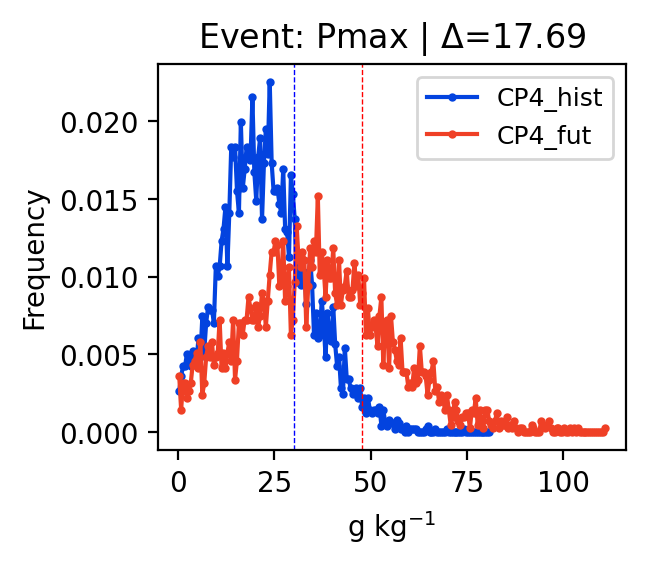

In [25]:
f = plt.figure(figsize=(9,5), dpi=200)
ax = f.add_subplot(236)

var = 'pmax'
cp4 = hist2d.basic_1d_binning(lhist[var], np.arange(np.min(lhist[var]), np.max(lhist[var]),0.5))
cp4f = hist2d.basic_1d_binning(lfut[var], np.arange(np.min(lfut[var]), np.max(lfut[var]),0.5))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('g kg$^{-1}$')
plt.title('Event: Pmax | $\Delta$='+str(np.round(np.nanpercentile(lfut[var],75)-np.nanpercentile(lhist[var],75),2)))
ax.axvline(np.nanpercentile(lhist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lfut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)
plt.tight_layout()

In [26]:
lhist.keys()

Index(['lw_out_PBLtop_0.25deg', 'lsRain_0.25deg', 'shear_0.25deg',
       'u_mid_0.25deg', 'u_srfc_0.25deg', 'v_mid_0.25deg', 'v_srfc_0.25deg',
       'q_mid_0.25deg', 't_mid_0.25deg', 't_srfc_0.25deg', 'q_srfc_0.25deg',
       'geoH_srfc_0.25deg', 'tcwv_0.25deg', 'sh_0.25deg', 'lh_0.25deg',
       't2_0.25deg', 'q2_0.25deg', 'lsRain_noon_0.25deg', 'lwout_noon_0.25deg',
       'SM_0.25deg', 'lw_out_PBLtop_1deg', 'lsRain_1deg', 'shear_1deg',
       'u_mid_1deg', 'u_srfc_1deg', 'v_mid_1deg', 'v_srfc_1deg', 'q_mid_1deg',
       't_mid_1deg', 't_srfc_1deg', 'q_srfc_1deg', 'geoH_srfc_1deg',
       'tcwv_1deg', 'sh_1deg', 'lh_1deg', 't2_1deg', 'q2_1deg',
       'lsRain_noon_1deg', 'lwout_noon_1deg', 'SM_1deg', 'lw_out_PBLtop_Smean',
       'lsRain_Smean', 'shear_Smean', 'u_mid_Smean', 'u_srfc_Smean',
       'v_mid_Smean', 'v_srfc_Smean', 'q_mid_Smean', 't_mid_Smean',
       't_srfc_Smean', 'q_srfc_Smean', 'geoH_srfc_Smean', 'tcwv_Smean',
       'sh_Smean', 'lh_Smean', 't2_Smean', 'q2_Smean',

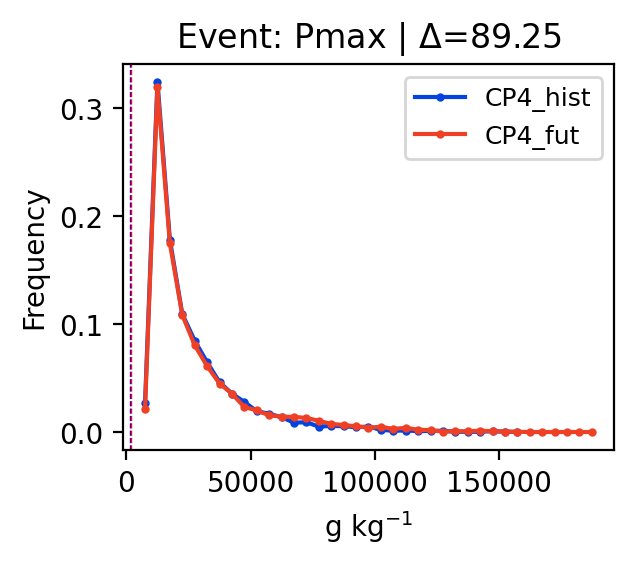

In [27]:
f = plt.figure(figsize=(9,5), dpi=200)
ax = f.add_subplot(236)

var = 'area'
cp4 = hist2d.basic_1d_binning(lhist[var]*4.4**2, np.arange(5000, np.max(lhist[var]*4.4**2),5000))
cp4f = hist2d.basic_1d_binning(lfut[var]*4.4**2, np.arange(5000, np.max(lfut[var]*4.4**2),5000))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('g kg$^{-1}$')
plt.title('Event: Pmax | $\Delta$='+str(np.round(np.nanpercentile(lfut[var],75)-np.nanpercentile(lhist[var],75),2)))
ax.axvline(np.nanpercentile(lhist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lfut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)
plt.tight_layout()

KeyError: 'area_5mm'

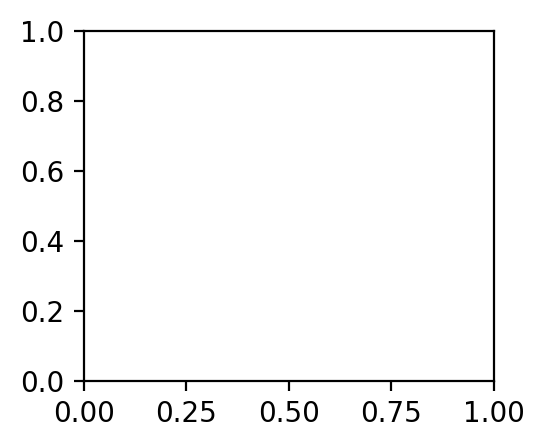

In [29]:
f = plt.figure(figsize=(9,5), dpi=200)
ax = f.add_subplot(236)

var = 'area_5mm'
cp4 = hist2d.basic_1d_binning(lhist[var], np.arange(1, np.max(lhist[var]),50))
cp4f = hist2d.basic_1d_binning(lfut[var], np.arange(1, np.max(lfut[var]),50))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('g kg$^{-1}$')
plt.title('Event: Pmax | $\Delta$='+str(np.round(np.nanpercentile(lfut[var],75)-np.nanpercentile(lhist[var],75),2)))
ax.axvline(np.nanpercentile(lhist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lfut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)
plt.tight_layout()

In [ ]:
lhist['SHgrad'].size

In [ ]:
lahist = pd.read_csv('/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/tables/hist_table_1700_inclStormChar_anom_200km.csv', index_col=0).transpose()
lafut =  pd.read_csv('/gws/nopw/j04/lmcs/cklein/CP_models/MCS_files/WAf/moved_fromCEH/tables/fut_table_1700_inclStormChar_anom_200km.csv', index_col=0).transpose()

In [30]:
for var in lahist.keys():
    try:
        lahist[var] = lahist[var].astype(float)
    except:
        pass
for var in lafut.keys():
    try:
        lafut[var] = lafut[var].astype(float)
    except:
        pass

In [31]:
lahist = lahist.copy()
lafut = lafut.copy()

In [32]:
lahist['EF'] = (lahist['lh_cl'] / (lahist['lh_cl']+lahist['sh_cl']))
lafut['EF'] = (lafut['lh_cl'] / (lafut['lh_cl']+lafut['sh_cl']))

In [33]:
lhist['EF'] = (lhist['lh_1deg'] / (lhist['lh_1deg']+lhist['sh_1deg']))
lfut['EF'] = (lfut['lh_1deg'] / (lfut['lh_1deg']+lfut['sh_1deg']))

In [34]:
lhist['Tdiff'] = (lhist['t2_1deg']-273.15) - lhist['t_srfc_1deg']
lfut['Tdiff'] = (lfut['t2_1deg']-273.15) - lfut['t_srfc_1deg']

In [35]:
lahist['Tdiff'] = (lahist['t2_1deg']-273.15) - lahist['t_srfc_1deg']
lafut['Tdiff'] = (lafut['t2_1deg']-273.15) - lafut['t_srfc_1deg']

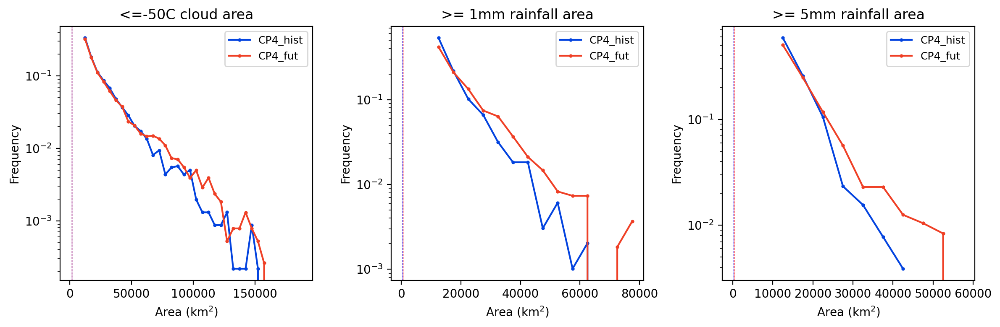

In [36]:
f = plt.figure(figsize=(12,4), dpi=200)
ax = f.add_subplot(131)

var = 'area'
cp4 = hist2d.basic_1d_binning(lahist[var]*4.4**2, np.arange(10000, np.max(lahist[var]*4.4**2),5000))
cp4f = hist2d.basic_1d_binning(lafut[var]*4.4**2, np.arange(10000, np.max(lafut[var]*4.4**2),5000))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel(r'Area (km$^{2}$)')
plt.title('<=-50C cloud area')
ax.axvline(np.nanpercentile(lhist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lfut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)
plt.yscale('log')
plt.tight_layout()

ax = f.add_subplot(132)

var = 'area_1mm'
cp4 = hist2d.basic_1d_binning(lahist[var]*4.4**2, np.arange(10000, np.max(lahist[var]*4.4**2),5000))
cp4f = hist2d.basic_1d_binning(lafut[var]*4.4**2, np.arange(10000, np.max(lafut[var]*4.4**2),5000))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel(r'Area (km$^{2}$)')
plt.title('>= 1mm rainfall area')
ax.axvline(np.nanpercentile(lahist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lafut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)
plt.yscale('log')
plt.tight_layout()

ax = f.add_subplot(133)

var = 'area_5mm'
cp4 = hist2d.basic_1d_binning(lahist[var]*4.4**2, np.arange(10000, np.max(lahist[var]*4.4**2),5000))
cp4f = hist2d.basic_1d_binning(lafut[var]*4.4**2, np.arange(10000, np.max(lafut[var]*4.4**2),5000))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel(r'Area (km$^{2}$)')
plt.title('>= 5mm rainfall area')
ax.axvline(np.nanpercentile(lahist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lafut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)
plt.yscale('log')
plt.tight_layout()
f.savefig('./cp4_cloud_rain_area.jpg')

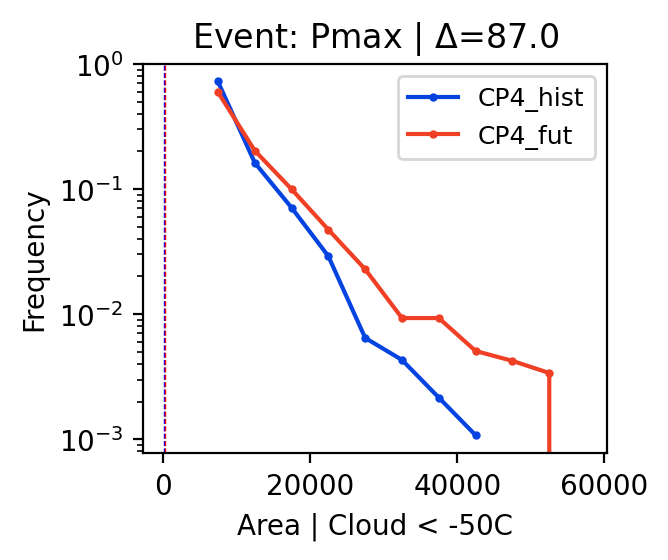

In [37]:
f = plt.figure(figsize=(9,5), dpi=200)
ax = f.add_subplot(236)

var = 'area_5mm'
cp4 = hist2d.basic_1d_binning(lahist[var]*4.4**2, np.arange(5000, np.max(lahist[var]*4.4**2),5000))
cp4f = hist2d.basic_1d_binning(lafut[var]*4.4**2, np.arange(5000, np.max(lafut[var]*4.4**2),5000))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('Area | Cloud < -50C')
plt.title('Event: Pmax | $\Delta$='+str(np.round(np.nanpercentile(lafut[var],75)-np.nanpercentile(lahist[var],75),2)))
ax.axvline(np.nanpercentile(lahist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lafut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)
plt.yscale('log')
plt.tight_layout()

In [38]:
lhist = lhist[lhist['EF']<0.75]
lfut = lfut[lfut['EF']<0.75]
lahist = lahist[lahist['EF']<0.75]
lafut = lafut[lafut['EF']<0.75]

In [39]:
from utils import u_met
def calc_theta_table(da, moist=False):    
    p = 1000

    t = da['t2_1deg'].values - 273.15
    q = da['q2_1deg'].values
    
    if moist:
        theta = u_met.theta_e(p, t, q)
    else:
        theta = u_met.theta(p,t) 
        
        
    p = 925
    
    t = da['t_srfc_1deg'].values
    q = da['q_srfc_1deg'].values/1000
    
    if moist:
        theta2 = u_met.theta_e(p, t, q)
    else:
        theta2 = u_met.theta(p,t) 
    
    return np.array((theta2+theta)/2)

In [40]:
len(lahist)

3801

In [41]:
lhist['theta-e'] = calc_theta_table(lhist, moist=True)
lhist['theta'] = calc_theta_table(lhist)

lfut['theta-e'] = calc_theta_table(lfut, moist=True)
lfut['theta'] = calc_theta_table(lfut)

/tmp/ipykernel_702/970275887.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lhist['theta-e'] = calc_theta_table(lhist, moist=True)
/tmp/ipykernel_702/970275887.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lhist['theta'] = calc_theta_table(lhist)


In [42]:
lahist['theta-e'] = calc_theta_table(lahist+lhist.mean(), moist=True)
lahist['theta'] = calc_theta_table(lahist+lhist.mean())

lafut['theta-e'] = calc_theta_table(lafut+lfut.mean(), moist=True)
lafut['theta'] = calc_theta_table(lafut+lfut.mean())

lahist['theta-e'] = lahist['theta-e']-lhist['theta-e'].mean()
lafut['theta-e'] = lafut['theta-e']-lfut['theta-e'].mean()

lahist['theta'] = lahist['theta']-lhist['theta'].mean()
lafut['theta'] = lafut['theta']-lfut['theta'].mean()

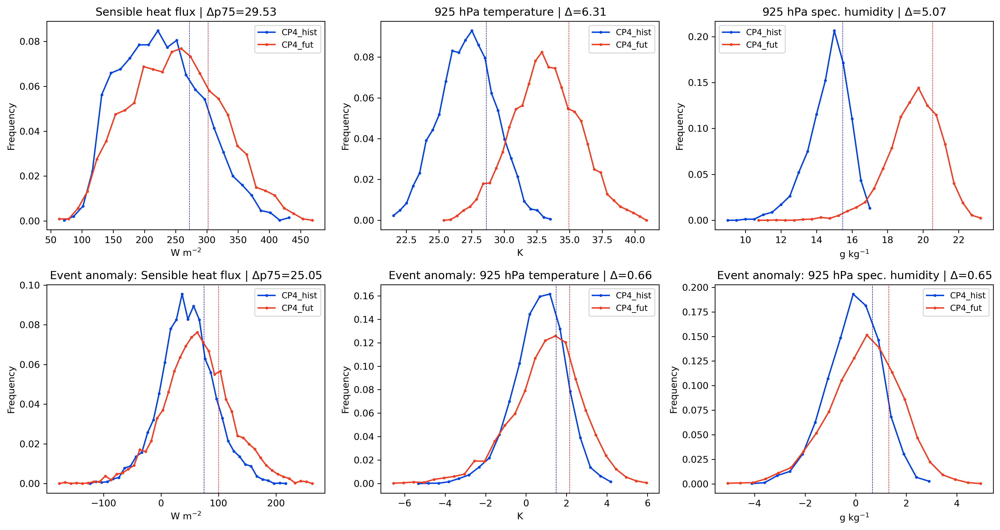

In [43]:
f = plt.figure(figsize=(15,8), dpi=300)



ax = f.add_subplot(231)

var = 'sh_1deg'
efplot = lhist[var]
efhist = efplot
efplot = lfut[var]
effut = efplot
cp4 = hist2d.basic_1d_binning(efhist, np.arange(np.min(efhist), np.max(efhist),15))
cp4f = hist2d.basic_1d_binning(effut, np.arange(np.min(effut), np.max(effut),15))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('W m$^{-2}$')
plt.title('Sensible heat flux | $\Delta$p75='+str(np.round(np.nanpercentile(effut,75)-np.nanpercentile(efhist,75),2)))
ax.axvline(np.nanpercentile(efhist,75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(effut,75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)


ax = f.add_subplot(232)

var = 't_srfc_1deg'
cp4 = hist2d.basic_1d_binning(lhist[var], np.arange(np.min(lhist[var]), np.max(lhist[var]),0.5))
cp4f = hist2d.basic_1d_binning(lfut[var], np.arange(np.min(lfut[var]), np.max(lfut[var]),0.5))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('K')
plt.title('925 hPa temperature | $\Delta$='+str(np.round(np.nanpercentile(lfut[var],75)-np.nanpercentile(lhist[var],75),2)))
ax.axvline(np.nanpercentile(lhist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lfut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)


ax = f.add_subplot(233)

var = 'q_srfc_1deg'
cp4 = hist2d.basic_1d_binning(lhist[var], np.arange(np.min(lhist[var]), np.max(lhist[var]),0.5))
cp4f = hist2d.basic_1d_binning(lfut[var], np.arange(np.min(lfut[var]), np.max(lfut[var]),0.5))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('g kg$^{-1}$')
plt.title('925 hPa spec. humidity | $\Delta$='+str(np.round(np.nanpercentile(lfut[var],75)-np.nanpercentile(lhist[var],75),2)))
ax.axvline(np.nanpercentile(lhist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lfut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)



ax = f.add_subplot(234)

var = 'sh_1deg'
efplot = lahist[var]
efhist = efplot
efplot = lafut[var]
effut = efplot
cp4 = hist2d.basic_1d_binning(efhist, np.arange(np.min(efhist), np.max(efhist),10))
cp4f = hist2d.basic_1d_binning(effut, np.arange(np.min(effut), np.max(effut),10))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('W m$^{-2}$')
plt.title('Event anomaly: Sensible heat flux | $\Delta$p75='+str(np.round(np.nanpercentile(effut,75)-np.nanpercentile(efhist,75),2)))
ax.axvline(np.nanpercentile(efhist,75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(effut,75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)


ax = f.add_subplot(235)

var = 't_srfc_1deg'
cp4 = hist2d.basic_1d_binning(lahist[var], np.arange(np.min(lahist[var]), np.max(lahist[var]),0.5))
cp4f = hist2d.basic_1d_binning(lafut[var], np.arange(np.min(lafut[var]), np.max(lafut[var]),0.5))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('K')
plt.title('Event anomaly: 925 hPa temperature | $\Delta$='+str(np.round(np.nanpercentile(lafut[var],75)-np.nanpercentile(lahist[var],75),2)))
ax.axvline(np.nanpercentile(lahist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lafut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)


ax = f.add_subplot(236)

var = 'q_mid_1deg'
cp4 = hist2d.basic_1d_binning(lahist[var], np.arange(np.min(lahist[var]), np.max(lahist[var]),0.5))
cp4f = hist2d.basic_1d_binning(lafut[var], np.arange(np.min(lafut[var]), np.max(lafut[var]),0.5))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('g kg$^{-1}$')
plt.title('Event anomaly: 925 hPa spec. humidity | $\Delta$='+str(np.round(np.nanpercentile(lafut[var],75)-np.nanpercentile(lahist[var],75),2)))
ax.axvline(np.nanpercentile(lahist[var],75), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanpercentile(lafut[var],75), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)
plt.tight_layout()
#f.savefig(cnst.network_data + 'figs/LMCS/CP4_PNASstudy/raw_variable_distributions_100km-Box.jpg')

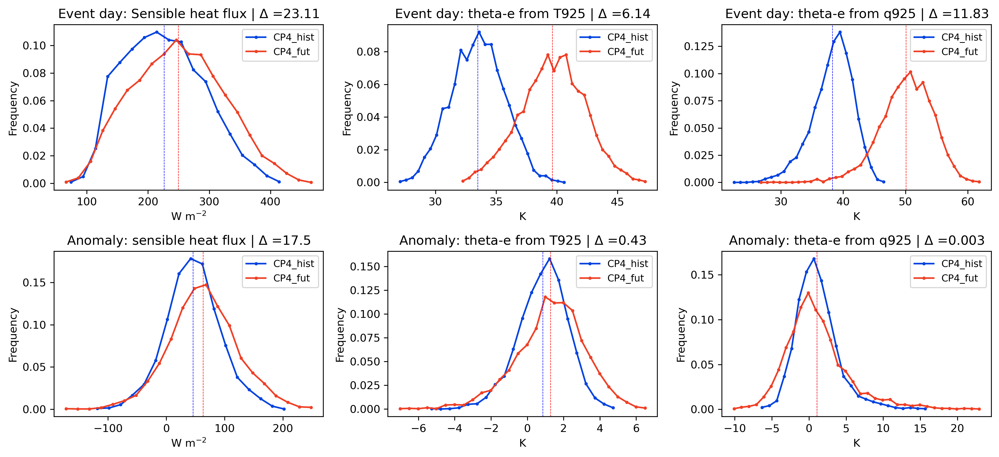

In [44]:
f = plt.figure(figsize=(13,6), dpi=300)



ax = f.add_subplot(231)

var = 'sh_1deg'
efplot = lhist[var]
efhist = efplot
efplot = lfut[var]
effut = efplot
cp4 = hist2d.basic_1d_binning(efhist, np.arange(np.min(efhist), np.max(efhist),20))
cp4f = hist2d.basic_1d_binning(effut, np.arange(np.min(effut), np.max(effut),20))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('W m$^{-2}$')
plt.title('Event day: Sensible heat flux | $\Delta$ ='+str(np.round(np.nanmean(effut)-np.nanmean(efhist),2)))
ax.axvline(np.nanmean(efhist), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanmean(effut), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)


ax = f.add_subplot(232)

var = 'theta'

thet_hist = lhist[var]
thet_fut = lfut[var]

cp4 = hist2d.basic_1d_binning(thet_hist, np.arange(np.min(thet_hist), np.max(thet_hist),0.5))
cp4f = hist2d.basic_1d_binning(thet_fut, np.arange(np.min(thet_fut), np.max(thet_fut),0.5))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('K')
plt.title('Event day: theta-e from T925 | $\Delta$ ='+str(np.round(np.nanmean(lfut[var])-np.nanmean(lhist[var]),2)))
ax.axvline(np.nanmean(lhist[var]), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanmean(lfut[var]), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)


ax = f.add_subplot(233)

var = 'theta-e'
cp4 = hist2d.basic_1d_binning(lhist[var]-thet_hist, np.arange(np.min(lhist[var]-thet_hist), np.max(lhist[var]-thet_hist),1))
cp4f = hist2d.basic_1d_binning(lfut[var]-thet_fut, np.arange(np.min(lfut[var]-thet_fut), np.max(lfut[var]-thet_fut),1))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('K')
plt.title('Event day: theta-e from q925 | $\Delta$ ='+str(np.round(np.nanmean(lfut[var]-thet_fut)-np.nanmean(lhist[var]-thet_hist),2)))
ax.axvline(np.nanmean(lhist[var]-thet_hist), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanmean(lfut[var]-thet_fut), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)



ax = f.add_subplot(234)

var = 'sh_1deg'
efplot = lahist[var]
efhist = efplot
efplot = lafut[var]
effut = efplot
cp4 = hist2d.basic_1d_binning(efhist, np.arange(np.min(efhist), np.max(efhist),20))
cp4f = hist2d.basic_1d_binning(effut, np.arange(np.min(effut), np.max(effut),20))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('W m$^{-2}$')
plt.title('Anomaly: sensible heat flux | $\Delta$ ='+str(np.round(np.nanmean(effut)-np.nanmean(efhist),2))) 
ax.axvline(np.nanmean(efhist), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanmean(effut), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)


ax = f.add_subplot(235)

var = 'theta'

thet_hist = lahist[var]
thet_fut = lafut[var]

cp4 = hist2d.basic_1d_binning(thet_hist, np.arange(np.min(thet_hist), np.max(thet_hist),0.5))
cp4f = hist2d.basic_1d_binning(thet_fut, np.arange(np.min(thet_fut), np.max(thet_fut),0.5))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('K')
plt.title('Anomaly: theta-e from T925 | $\Delta$ ='+str(np.round(np.nanmean(lafut[var])-np.nanmean(lahist[var]),2))) 
ax.axvline(np.nanmean(lahist[var]), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanmean(lafut[var]), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)


ax = f.add_subplot(236)

var = 'theta-e'
cp4 = hist2d.basic_1d_binning(lahist[var]-thet_hist, np.arange(np.min(lahist[var]-thet_hist), np.max(lahist[var]-thet_hist),1))
cp4f = hist2d.basic_1d_binning(lafut[var]-thet_fut, np.arange(np.min(lafut[var]-thet_fut), np.max(lafut[var]-thet_fut),1))
plt.plot(cp4['xbins'], cp4['nb']/np.sum(cp4['nb']), color='xkcd:blue', label='CP4_hist', marker='o', markersize=2)
plt.plot(cp4f['xbins'], cp4f['nb']/np.sum(cp4f['nb']), color='xkcd:tomato', label='CP4_fut', marker='o', markersize=2)
plt.ylabel('Frequency')
plt.xlabel('K')
plt.title('Anomaly: theta-e from q925 | $\Delta$ ='+str(np.round(np.nanmean(lafut[var]-thet_fut)-np.nanmean(lahist[var]-thet_hist),3)))
ax.axvline(np.nanmean(lahist[var]-thet_hist), color='b', linestyle='dashed', linewidth=0.5)
ax.axvline(np.nanmean(lafut[var]-thet_fut), color='r', linestyle='dashed', linewidth=0.5)
plt.legend(fontsize=9)
plt.tight_layout()
#f.savefig(cnst.network_data + 'figs/LMCS/CP4_PNASstudy/theta_variable_distributions_100km-Box.jpg')

In [45]:
print(list(lhist.keys()))

['lw_out_PBLtop_0.25deg', 'lsRain_0.25deg', 'shear_0.25deg', 'u_mid_0.25deg', 'u_srfc_0.25deg', 'v_mid_0.25deg', 'v_srfc_0.25deg', 'q_mid_0.25deg', 't_mid_0.25deg', 't_srfc_0.25deg', 'q_srfc_0.25deg', 'geoH_srfc_0.25deg', 'tcwv_0.25deg', 'sh_0.25deg', 'lh_0.25deg', 't2_0.25deg', 'q2_0.25deg', 'lsRain_noon_0.25deg', 'lwout_noon_0.25deg', 'SM_0.25deg', 'lw_out_PBLtop_1deg', 'lsRain_1deg', 'shear_1deg', 'u_mid_1deg', 'u_srfc_1deg', 'v_mid_1deg', 'v_srfc_1deg', 'q_mid_1deg', 't_mid_1deg', 't_srfc_1deg', 'q_srfc_1deg', 'geoH_srfc_1deg', 'tcwv_1deg', 'sh_1deg', 'lh_1deg', 't2_1deg', 'q2_1deg', 'lsRain_noon_1deg', 'lwout_noon_1deg', 'SM_1deg', 'lw_out_PBLtop_Smean', 'lsRain_Smean', 'shear_Smean', 'u_mid_Smean', 'u_srfc_Smean', 'v_mid_Smean', 'v_srfc_Smean', 'q_mid_Smean', 't_mid_Smean', 't_srfc_Smean', 'q_srfc_Smean', 'geoH_srfc_Smean', 'tcwv_Smean', 'sh_Smean', 'lh_Smean', 't2_Smean', 'q2_Smean', 'lsRain_noon_Smean', 'lwout_noon_Smean', 'SM_Smean', 'hour', 'month', 'year', 'day', 'lon', 'lat

PearsonRResult(statistic=-0.264879498837281, pvalue=1.0831514765016902e-53)
PearsonRResult(statistic=-0.22077048353432124, pvalue=7.604337866222538e-38)
PearsonRResult(statistic=-0.30629298345227973, pvalue=4.85207266312358e-77)


Text(0.5, 1.0, 'sh versus tcwv')

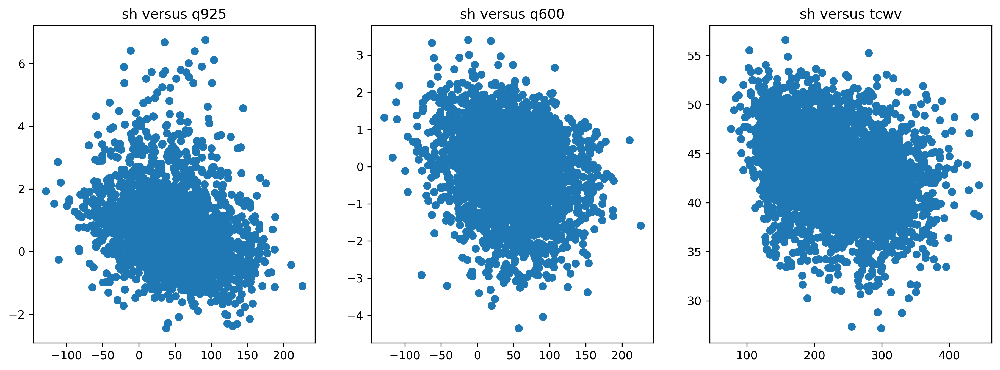

In [46]:
f = plt.figure(figsize=(15,5), dpi=300)
ax = f.add_subplot(131)
a=lahist['q_srfc_1deg']
b=lahist['sh_1deg']
a = a[np.isfinite(a)&np.isfinite(b)]
b = b[np.isfinite(a)&np.isfinite(b)]
plt.scatter(b,a)
print(stats.pearsonr(b, a))
plt.title('sh versus q925')

ax = f.add_subplot(132)
a=lahist['q_mid_1deg']
b=lahist['sh_1deg']
a = a[np.isfinite(a)&np.isfinite(b)]
b = b[np.isfinite(a)&np.isfinite(b)]
plt.scatter(b,a)
print(stats.pearsonr(b, a))
plt.title('sh versus q600')

ax = f.add_subplot(133)
a=lhist['tcwv_1deg']
b=lhist['sh_1deg']
a = a[np.isfinite(a)&np.isfinite(b)]
b = b[np.isfinite(a)&np.isfinite(b)]
plt.scatter(b,a)
print(stats.pearsonr(b, a))
plt.title('sh versus tcwv')

## ALL NEGATIVELY CORRELATED WITH SH

PearsonRResult(statistic=-0.32285273178377216, pvalue=4.346212919528699e-54)
PearsonRResult(statistic=-0.20069637499176868, pvalue=8.358128151027125e-22)
PearsonRResult(statistic=-0.2814463964794526, pvalue=4.30445672804967e-42)


Text(0.5, 1.0, 'sh versus tcwv')

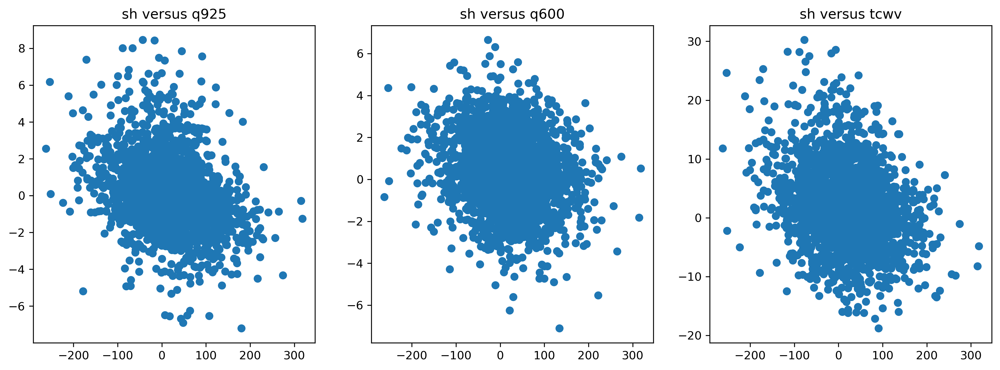

In [47]:
f = plt.figure(figsize=(15,5), dpi=300)
ax = f.add_subplot(131)
a=lafut['q_srfc_1deg']-lahist['q_srfc_1deg']
b=lafut['sh_1deg']-lahist['sh_1deg']
a = a[np.isfinite(a)&np.isfinite(b)]
b = b[np.isfinite(a)&np.isfinite(b)]
plt.scatter(b,a)
print(stats.pearsonr(b, a))
plt.title('sh versus q925')

ax = f.add_subplot(132)
a=lafut['q_mid_1deg']-lahist['q_mid_1deg']
b=lafut['sh_1deg']-lahist['sh_1deg']
a = a[np.isfinite(a)&np.isfinite(b)]
b = b[np.isfinite(a)&np.isfinite(b)]
plt.scatter(b,a)
print(stats.pearsonr(b, a))
plt.title('sh versus q600')

ax = f.add_subplot(133)
a=lafut['tcwv_1deg']-lahist['tcwv_1deg']
b=lafut['sh_1deg']-lahist['sh_1deg']
a = a[np.isfinite(a)&np.isfinite(b)]
b = b[np.isfinite(a)&np.isfinite(b)]
plt.scatter(b,a)
print(stats.pearsonr(b, a))
plt.title('sh versus tcwv')

## ALL NEGATIVELY CORRELATED WITH SH

In [48]:
lafut['pmax']-lahist['pmax']

0       13.445491
1      -18.782215
10     -18.218768
100    -29.617276
1000    39.946131
          ...    
995      9.592490
996     39.613542
997     20.121952
998     27.852436
999     -9.381459
Name: pmax, Length: 4483, dtype: float64

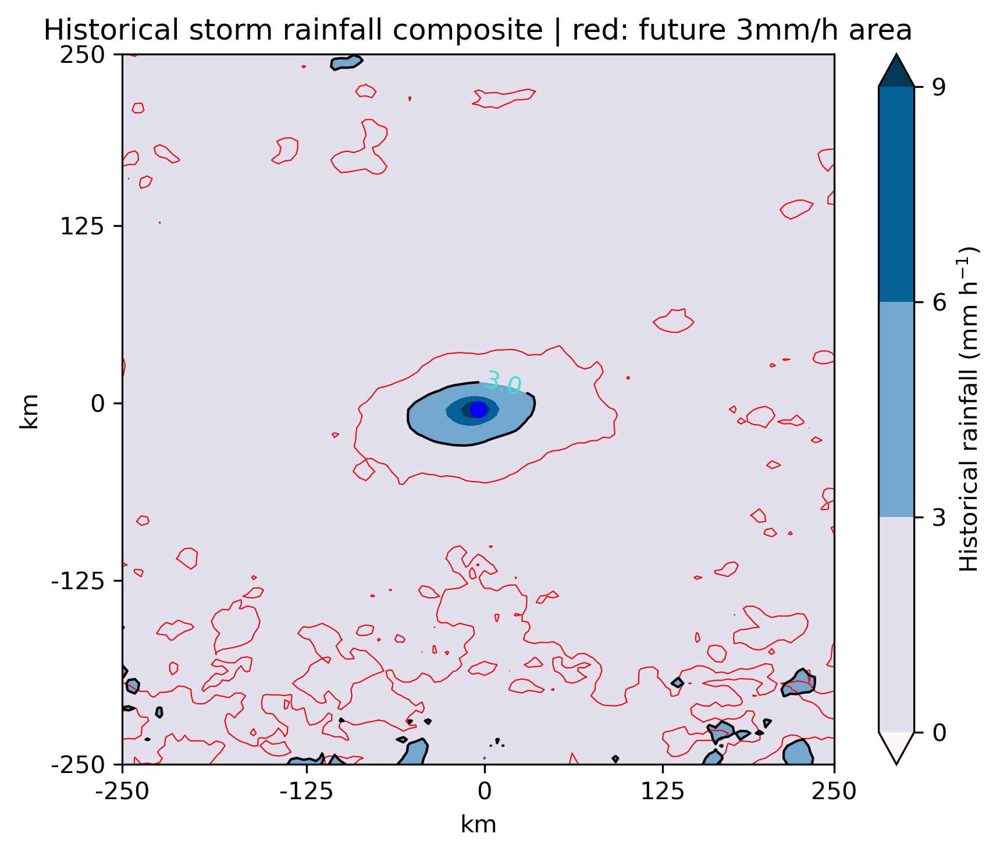

In [50]:
f = plt.figure(figsize=(6,5), dpi=300)
mname = 'node'
extent = 57 #* 4.4

ticks = np.array([0,58-57/2,58,58+57/2,114])
#labels = np.rint([-57*4.4,-57/2*4.4,0,57/2*4.4, 57*4.4])
labels = [-250,-125,0,125,250]
box = [57-22, 57+22, 57-22, 57+22]

ax = f.add_subplot(1,1,1)
ano =da_fut['lsRain']#-da_hist['lsRain'])
cont = da_hist['lsRain']

thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

plt.contourf(cont, cmap='PuBu', extend='both', levels=[0,3,6,9])
plt.colorbar(label='Historical rainfall (mm h$^{-1}$)')
plt.contour(ano, colors='red', levels=[-10,3], linewidths=0.5)#levels=np.linspace(thresh * -1, thresh, 10)

plt.title('Historical storm rainfall composite | red: future 3mm/h area')
cm = ax.contour(cont, colors='k', levels=[-10, 3], linewidths=1)
ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')

# pv, pw = da_hist_anom['u_srfc'].values, da_hist_anom['v_srfc'].values
# qv = plt.quiver(np.arange(da_hist.longitude.shape[0])[::10], np.arange(da_hist.latitude.shape[0])[::10], pv[::10,::10], pw[::10,::10])

plt.plot(extent, extent, 'bo')
ax.set_xlabel('km')
ax.set_ylabel('km')
ax.set_xticks(ticks)
ax.set_xticklabels(labels)
ax.set_yticks(ticks)
ax.set_yticklabels(labels)


# ax = f.add_subplot(1,2,2)

# pos = da_fut

# ano =da_fut['lsRain']#-da_his
# cont = da_hist['lsRain']

# thresh = np.max(np.abs(np.percentile(ano, [5, 95])))

# plt.contourf(ano, cmap='PuBu', extend='both', levels=[3,6,9])
# plt.colorbar(label='$\Delta$ Rainfall (mm h$^{-1}$)')
# plt.contour(ano, colors='red', levels=[-5,3], linewidths=0.5)#levels=np.linspace(thresh * -1, thresh, 10)

# plt.title('black: Historical rainfall mean (mm h$^{-1}$)')
# cm = ax.contour(cont, colors='k', levels=[-5, 3], linewidths=1)
# ax.clabel(cm, inline=True, fontsize=10, fmt='%1.1f', colors='turquoise')

# # pv, pw = da_hist_anom['u_srfc'].values, da_hist_anom['v_srfc'].values
# # qv = plt.quiver(np.arange(da_hist.longitude.shape[0])[::10], np.arange(da_hist.latitude.shape[0])[::10], pv[::10,::10], pw[::10,::10])

# plt.plot(extent, extent, 'bo')
# ax.set_xlabel('km')
# ax.set_ylabel('km')
# ax.set_xticks(ticks)
# ax.set_xticklabels(labels)
# ax.set_yticks(ticks)
# ax.set_yticklabels(labels)


plt.tight_layout()
#f.savefig(cnst.network_data + 'figs/LMCS/CP4_PNASstudy/area_change.jpg')

In [51]:
histp25, histp75 = np.nanpercentile(lahist['sh_1deg'], [25,75])
futp25, futp75 = np.nanpercentile(lafut['sh_1deg'], [25,75])

histposlow = lahist['sh_1deg'] < histp25
histposhigh = lahist['sh_1deg'] > histp75

futposlow = lafut['sh_1deg'] < futp25
futposhigh = lafut['sh_1deg'] > futp75

In [52]:
print(histp25, histp75)

15.958349028364086 74.97727916408145


In [53]:
print(futp25, futp75)

26.155087241384514 100.0292799740854


In [54]:
histp25, histp75 = np.nanpercentile(lahistd['sh_1deg'], [25,75])
futp25, futp75 = np.nanpercentile(lafutd['sh_1deg'], [25,75])

histposlowd = lahistd['sh_1deg'] < histp25
histposhighd = lahistd['sh_1deg'] > histp75

futposlowd = lafutd['sh_1deg'] < futp25
futposhighd = lafutd['sh_1deg'] > futp75

In [55]:
print(histp25, histp75)

4.927348635921206 65.0532027593552


In [56]:
print(futp25, futp75)

16.557499405135502 93.94051069306234


In [57]:
lahist.shape

(3801, 110)

In [58]:
lafut.shape

(3546, 106)

In [59]:
lhist['pmax'].min()


0.0269705650186924

In [60]:
lfut['pmax'].min()

0.0199505415601902

t2 wet 281053.0 7.944266715658708e-07
t2 dry 121644.0 3.265458957265376e-106
t2 wet 316607.0 0.2830605196976964
t2 dry 162020.0 6.661644057332921e-69
t2 wet 192741.0 1.4513063274138707e-46
t2 dry 138518.0 8.152080936877818e-90
allcase difference 13.315775822739916
drycase difference 15.767748726420965
allcase difference rel to hist 0.5955221576626488
drycase difference rel to hist 0.6189688465068803
t2 wet 192741.0 1.4513063274138707e-46
t2 dry 138518.0 8.152080936877818e-90
SUMTEST 1.5543122344752192e-15
allcase difference 13.315775822739916
drycase difference 15.767748726420965
allcase difference rel to hist 0.5955221576626488
drycase difference rel to hist 0.6189688465068803


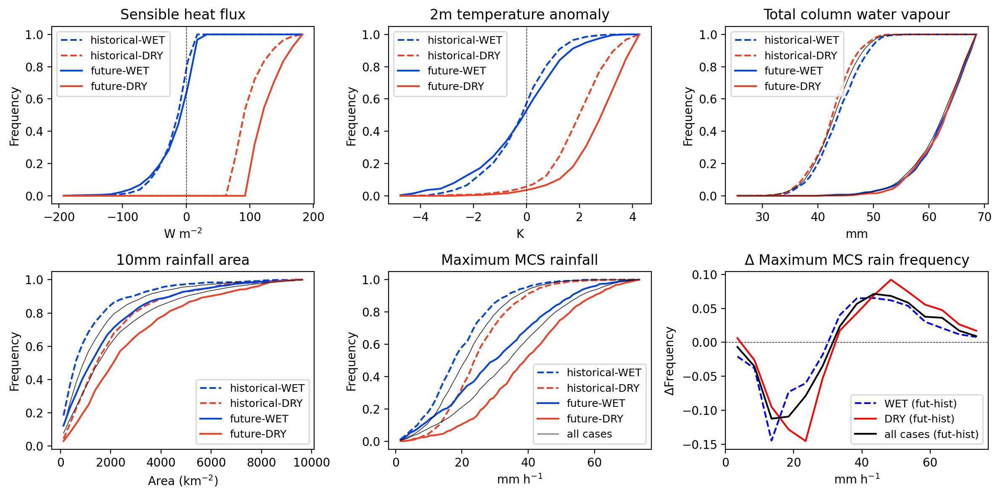

In [61]:
f = plt.figure(figsize=(12,6), dpi=200)



ax1 = f.add_subplot(231)

var = 'sh_1deg'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(-200, 200,15))
cp4f = hist2d.basic_1d_binning(high, np.arange(-200, 200,15))
alle = hist2d.basic_1d_binning(alls, np.arange(-200, 200,15))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(-200, 200,15))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(-200, 200,15))
falle = hist2d.basic_1d_binning(falls, np.arange(-200, 200,15))



bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
#plt.plot(bins, cumall, color='k', label='future' )

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
ax1.axvline(0, color='k', linestyle='dashed', linewidth=0.5)
#plt.plot(bins, fcumall, color='grey', label='future' )


plt.ylabel('Frequency')
plt.xlabel('W m$^{-2}$')
plt.title('Sensible heat flux')
plt.legend(fontsize=9)
plt.legend(fontsize=9)


ax1 = f.add_subplot(232)

var = 't2_1deg'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(-5, 5,0.5))
cp4f = hist2d.basic_1d_binning(high, np.arange(-5, 5,0.5))
alle = hist2d.basic_1d_binning(alls, np.arange(-5, 5,0.5))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(-5, 5,0.5))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(-5, 5,0.5))
falle = hist2d.basic_1d_binning(falls, np.arange(-5, 5,0.5))



bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
#plt.plot(bins, cumall, color='k', label='future' )

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
#plt.plot(bins, fcumall, color='grey', label='future' )


plt.ylabel('Frequency')
plt.xlabel('K')
plt.title('2m temperature anomaly')
plt.legend(fontsize=9)
plt.legend(fontsize=9)
ax1.axvline(0, color='k', linestyle='dashed', linewidth=0.5)


ax1 = f.add_subplot(233)

var = 'tcwv_cl'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(25, 70,1))
cp4f = hist2d.basic_1d_binning(high, np.arange(25, 70,1))
alle = hist2d.basic_1d_binning(alls, np.arange(25, 70,1))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(25, 70,1))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(25, 70,1))
falle = hist2d.basic_1d_binning(falls, np.arange(25, 70,1))

bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
plt.plot(bins, cumall, color='k', linewidth=0.5)

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
plt.plot(bins, fcumall, color='k', linewidth=0.5)


plt.ylabel('Frequency')
plt.xlabel('mm')
plt.title('Total column water vapour')
plt.legend(fontsize=9)
plt.legend(fontsize=9)


ax = f.add_subplot(234)

var = 'area_10mm'
low = lahist[var][histposlow]*(4.4*4.4)
high = lahist[var][histposhigh]*(4.4*4.4)
alls = lahist[var]*(4.4*4.4)

flow = lafut[var][futposlow]*(4.4*4.4)
fhigh = lafut[var][futposhigh]*(4.4*4.4)
falls = lafut[var]*(4.4*4.4)


cp4 = hist2d.basic_1d_binning(low, np.arange(1, 10000,250))
cp4f = hist2d.basic_1d_binning(high, np.arange(1, 10000,250))
alle = hist2d.basic_1d_binning(alls, np.arange(1, 10000,250))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(1, 10000,250))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(1, 10000,250))
falle = hist2d.basic_1d_binning(falls, np.arange(1, 10000,250))


bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
plt.plot(bins, cumall, color='k', linewidth=0.5)

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
plt.plot(bins, fcumall, color='k', linewidth=0.5)

plt.ylabel('Frequency')
plt.xlabel('Area (km$^{-2}$)')
plt.title('10mm rainfall area')

plt.legend(fontsize=9)



ax1 = f.add_subplot(235)

var = 'pmax'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(1, 75,1))
cp4f = hist2d.basic_1d_binning(high, np.arange(1, 75,1))
alle = hist2d.basic_1d_binning(alls, np.arange(1, 75,1))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(1, 75,1))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(1, 75,1))
falle = hist2d.basic_1d_binning(falls, np.arange(1, 75,1))



bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')


plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
plt.plot(bins, fcumall, color='k', linewidth=0.5)
plt.plot(bins, cumall, color='k', label='all cases', linewidth=0.5)

print('allcase difference', np.nanmean(falls)-np.nanmean(alls))
print('drycase difference', np.nanmean(fhigh)-np.nanmean(high))

print('allcase difference rel to hist', (np.nanmean(falls)-np.nanmean(alls))/np.nanmean(alls))
print('drycase difference rel to hist', (np.nanmean(fhigh)-np.nanmean(high))/np.nanmean(high))

plt.ylabel('Frequency')
plt.xlabel('mm h$^{-1}$')
plt.title('Maximum MCS rainfall')
plt.legend(fontsize=9)
plt.legend(fontsize=9)

ax1 = f.add_subplot(236)

var = 'pmax'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]

# low = lahistd[var][histposlowd]
# high = lahistd[var][histposhighd]
# alls = lahistd[var]

# flow = lafutd[var][futposlowd]
# fhigh = lafutd[var][futposhighd]
# falls = lafutd[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(1, 81,5))
cp4f = hist2d.basic_1d_binning(high, np.arange(1, 81,5))
alle = hist2d.basic_1d_binning(alls, np.arange(1, 81,5))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(1, 81,5))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(1, 81,5))
falle = hist2d.basic_1d_binning(falls, np.arange(1, 81,5))
ax1.axhline(0, linestyle='dashed', color='k', linewidth=0.5)


bins=cp4['xbins']

# cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
# cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
# cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

# fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
# fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
# fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

cumlow = (cp4['nb']/np.sum(cp4['nb']))
cumhigh = (cp4f['nb']/np.sum(cp4f['nb']))
cumall = (alle['nb']/np.sum(alle['nb']))

fcumlow = (fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = (fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = (falle['nb']/np.sum(falle['nb']))

stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(bins, fcumlow-cumlow, color='b', label='WET (fut-hist)', linestyle='dashed')
#plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')


plt.plot(bins, fcumhigh-cumhigh, color='r', label='DRY (fut-hist)' )
plt.plot(bins, fcumall-cumall, color='k', label='all cases (fut-hist)' )
#plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
# plt.plot(bins, fcumall, color='k', linewidth=0.5)
# plt.plot(bins, cumall, color='k', label='all cases', linewidth=0.5)

print('SUMTEST', np.sum((fcumhigh-cumhigh)*100))


print('allcase difference', np.nanmean(falls)-np.nanmean(alls))
print('drycase difference', np.nanmean(fhigh)-np.nanmean(high))

print('allcase difference rel to hist', (np.nanmean(falls)-np.nanmean(alls))/np.nanmean(alls))
print('drycase difference rel to hist', (np.nanmean(fhigh)-np.nanmean(high))/np.nanmean(high))
# perc = 75
# print('allcase difference', np.nanpercentile(falls, perc)-np.nanpercentile(alls, perc))
# print('drycase difference', np.nanpercentile(fhigh, perc)-np.nanpercentile(high, perc))

# print('allcase difference rel to hist', (np.nanpercentile(falls, perc)-np.nanpercentile(alls, perc))/np.nanpercentile(alls, perc))
# print('drycase difference rel to hist', (np.nanpercentile(fhigh, perc)-np.nanpercentile(high, perc))/np.nanpercentile(high, perc))

plt.ylabel('$\Delta$Frequency')
plt.xlabel('mm h$^{-1}$')
plt.title('$\Delta$ Maximum MCS rain frequency')
plt.legend(fontsize=9)
plt.legend(fontsize=9)


plt.tight_layout()
f.savefig('fig2_17h.jpg')

t2 wet 281053.0 7.944266715658708e-07
t2 dry 121644.0 3.265458957265376e-106
t2 wet 135777.0 0.0018141243728033256
t2 dry 124746.0 7.591801604596898e-07

t2 wet 192741.0 1.4513063274138707e-46
t2 dry 138518.0 8.152080936877818e-90
allcase difference 13.315775822739916
drycase difference 15.767748726420965
allcase difference rel to hist 0.5955221576626488
drycase difference rel to hist 0.6189688465068803
Hist p99
49.98684556695606
38.88888888888889
63.16425120772947
Hist p99 in future
77.8623801466441
67.2566371681416
89.00126422250317
Hist p99 in fut versus in hist
27.875534579688036
28.3677482792527
25.837013014773696
Mean rainfall increase
21.600969057038327
20.940841344728987
24.0633592012012


(None,)

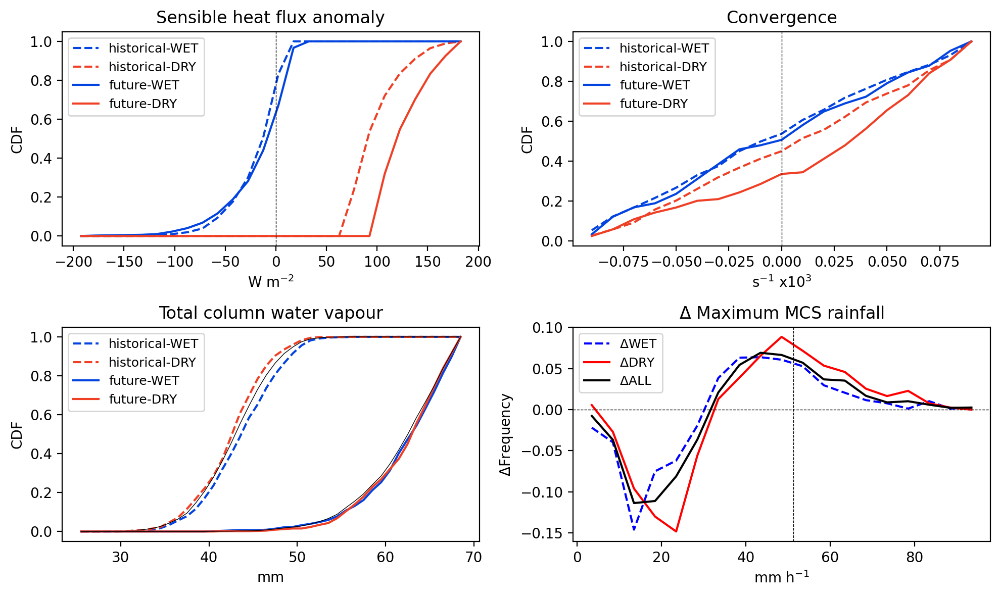

In [63]:
f = plt.figure(figsize=(10,6), dpi=200)



ax1 = f.add_subplot(221)

var = 'sh_1deg'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(-200, 200,15))
cp4f = hist2d.basic_1d_binning(high, np.arange(-200, 200,15))
alle = hist2d.basic_1d_binning(alls, np.arange(-200, 200,15))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(-200, 200,15))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(-200, 200,15))
falle = hist2d.basic_1d_binning(falls, np.arange(-200, 200,15))



bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

# cumlow = (cp4['nb']/np.sum(cp4['nb']))
# cumhigh = (cp4f['nb']/np.sum(cp4f['nb']))
# cumall = (alle['nb']/np.sum(alle['nb']))

# fcumlow = (fcp4['nb']/np.sum(fcp4['nb']))
# fcumhigh = (fcp4f['nb']/np.sum(fcp4f['nb']))
# fcumall = (falle['nb']/np.sum(falle['nb']))

stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
#plt.plot(bins, cumall, color='k', label='future' )

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
ax1.axvline(0, color='k', linestyle='dashed', linewidth=0.5)
#plt.plot(bins, fcumall, color='grey', label='future' )


plt.ylabel('CDF')
plt.xlabel('W m$^{-2}$')
plt.title('Sensible heat flux anomaly')
plt.legend(fontsize=9)
plt.legend(fontsize=9)


ax1 = f.add_subplot(222)

var = 'div'
### original divergence while rest is from old table
low = lahistd[var][histposlowd]*-10000
high = lahistd[var][histposhighd]*-10000
alls = lahistd[var]*-10000

flow = lafutd[var][futposlowd]*-10000
fhigh = lafutd[var][futposhighd]*-10000
falls = lafutd[var]*-10000


ranges = np.linspace(-0.1, 0.1,20)

cp4 = hist2d.basic_1d_binning(low, ranges)
cp4f = hist2d.basic_1d_binning(high, ranges)
alle = hist2d.basic_1d_binning(alls, ranges)

fcp4 = hist2d.basic_1d_binning(flow, ranges)
fcp4f = hist2d.basic_1d_binning(fhigh, ranges)
falle = hist2d.basic_1d_binning(falls, ranges)



bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

# cumlow = (cp4['nb']/np.sum(cp4['nb']))
# cumhigh = (cp4f['nb']/np.sum(cp4f['nb']))
# cumall = (alle['nb']/np.sum(alle['nb']))

# fcumlow = (fcp4['nb']/np.sum(fcp4['nb']))
# fcumhigh = (fcp4f['nb']/np.sum(fcp4f['nb']))
# fcumall = (falle['nb']/np.sum(falle['nb']))


stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
#plt.plot(bins, cumall, color='k', label='future' )

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
#plt.plot(bins, fcumall, color='grey', label='future' )


plt.ylabel('CDF')
plt.xlabel('s$^{-1}$ x10$^{3}$')
plt.title('Convergence')
plt.legend(fontsize=9)
plt.legend(fontsize=9)
ax1.axvline(0, color='k', linestyle='dashed', linewidth=0.5)


ax1 = f.add_subplot(223)

var = 'tcwv_cl'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(25, 70,1))
cp4f = hist2d.basic_1d_binning(high, np.arange(25, 70,1))
alle = hist2d.basic_1d_binning(alls, np.arange(25, 70,1))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(25, 70,1))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(25, 70,1))
falle = hist2d.basic_1d_binning(falls, np.arange(25, 70,1))

bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

# cumlow = (cp4['nb']/np.sum(cp4['nb']))
# cumhigh = (cp4f['nb']/np.sum(cp4f['nb']))
# cumall = (alle['nb']/np.sum(alle['nb']))

# fcumlow = (fcp4['nb']/np.sum(fcp4['nb']))
# fcumhigh = (fcp4f['nb']/np.sum(fcp4f['nb']))
# fcumall = (falle['nb']/np.sum(falle['nb']))

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
plt.plot(bins, cumall, color='k', linewidth=0.5)

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
plt.plot(bins, fcumall, color='k', linewidth=0.5)


plt.ylabel('CDF')
plt.xlabel('mm')
plt.title('Total column water vapour')
plt.legend(fontsize=9)
plt.legend(fontsize=9)




ax1 = f.add_subplot(224)

var = 'pmax'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(1, 101,5))
cp4f = hist2d.basic_1d_binning(high, np.arange(1, 101,5))
alle = hist2d.basic_1d_binning(alls, np.arange(1, 101,5))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(1, 101,5))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(1, 101,5))
falle = hist2d.basic_1d_binning(falls, np.arange(1, 101,5))

print()



bins=cp4['xbins']

# cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
# cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
# cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

# fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
# fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
# fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

cumlow = (cp4['nb']/np.sum(cp4['nb']))
cumhigh = (cp4f['nb']/np.sum(cp4f['nb']))
cumall = (alle['nb']/np.sum(alle['nb']))

fcumlow = (fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = (fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = (falle['nb']/np.sum(falle['nb']))

stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(bins, fcumlow-cumlow, color='b', label='$\Delta$WET', linestyle='dashed')
plt.plot(bins, fcumhigh-cumhigh, color='r', label='$\Delta$DRY' )
plt.plot(bins, fcumall-cumall, color='k', label='$\Delta$ALL' )
# plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
# plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
# plt.plot(bins, cumall, color='k', linewidth=0.5)

# plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
# plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
# plt.plot(bins, fcumall, color='k', linewidth=0.5)

#plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
# plt.plot(bins, fcumall, color='k', linewidth=0.5)
# plt.plot(bins, cumall, color='k', label='all cases', linewidth=0.5)

print('allcase difference', np.nanmean(falls)-np.nanmean(alls))
print('drycase difference', np.nanmean(fhigh)-np.nanmean(high))

print('allcase difference rel to hist', (np.nanmean(falls)-np.nanmean(alls))/np.nanmean(alls))
print('drycase difference rel to hist', (np.nanmean(fhigh)-np.nanmean(high))/np.nanmean(high))

plt.ylabel('$\Delta$Frequency')
plt.xlabel('mm h$^{-1}$')
plt.title('$\Delta$ Maximum MCS rainfall')
ax1.axhline(0,linestyle='dashed', color='k', linewidth=0.5)
#ax1.axvline(np.nanpercentile(high, 95), linestyle='dashed', color='r', linewidth=0.5)
#ax1.axvline(np.nanpercentile(low, 95), linestyle='dashed', color='b', linewidth=0.5)
ax1.axvline(np.nanpercentile(alls, 99), linestyle='dashed', color='k', linewidth=0.5)
p99 = np.percentile(alls,50)
print('Hist p99')
print(np.sum(alls>p99)/alls.size*100) #- np.sum(alls>p99)/alls.size)
print(np.sum(low>p99)/low.size*100)
print(np.sum(high>p99)/high.size*100)
print('Hist p99 in future')
print(np.sum(falls>p99)/falls.size*100)
print(np.sum(flow>p99)/flow.size*100)
print(np.sum(fhigh>p99)/fhigh.size*100)
print('Hist p99 in fut versus in hist')
print(np.sum(falls>p99)/falls.size*100 - np.sum(alls>p99)/alls.size*100) #- np.sum(alls>p99)/alls.size)
print(np.sum(flow>p99)/flow.size*100 - np.sum(low>p99)/low.size*100)
print(np.sum(fhigh>p99)/fhigh.size*100 - np.sum(high>p99)/high.size*100)

print('Mean rainfall increase')
print((np.percentile(falls, 90)-np.percentile(alls, 90)))
print((np.percentile(flow, 90)-np.percentile(low, 90)))
print((np.percentile(fhigh, 90)-np.percentile(high, 90)))

plt.legend(fontsize=9)
plt.legend(fontsize=9)

plt.tight_layout()
f.savefig('fig2_divergence.jpg'), 

t2 wet 281053.0 7.944266715658708e-07
t2 dry 121644.0 3.265458957265376e-106
t2 wet 316607.0 0.2830605196976964
t2 dry 162020.0 6.661644057332921e-69
t2 wet 192741.0 1.4513063274138707e-46
t2 dry 138518.0 8.152080936877818e-90
allcase difference 13.315775822739916
drycase difference 15.767748726420965
allcase difference rel to hist 0.5955221576626488
drycase difference rel to hist 0.6189688465068803


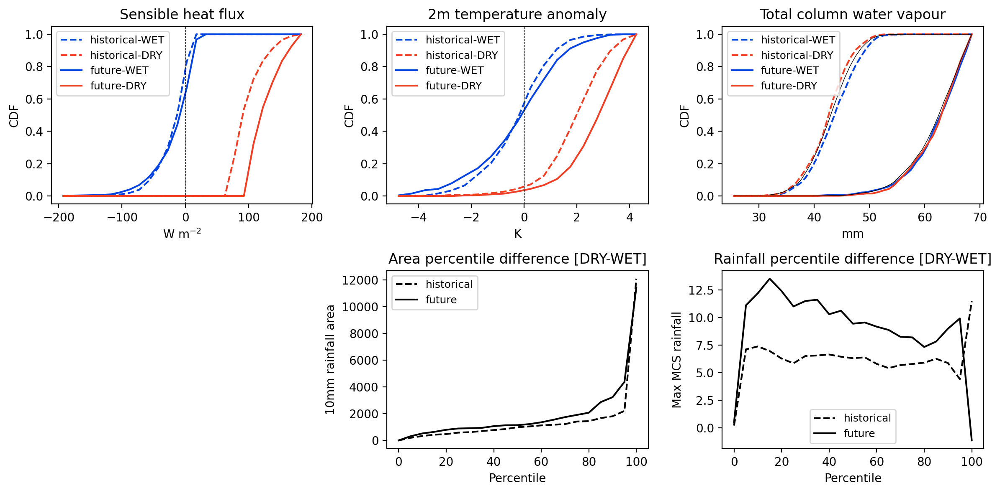

In [33]:
f = plt.figure(figsize=(12,6), dpi=200)



ax1 = f.add_subplot(231)

var = 'sh_1deg'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(-200, 200,15))
cp4f = hist2d.basic_1d_binning(high, np.arange(-200, 200,15))
alle = hist2d.basic_1d_binning(alls, np.arange(-200, 200,15))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(-200, 200,15))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(-200, 200,15))
falle = hist2d.basic_1d_binning(falls, np.arange(-200, 200,15))



bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
#plt.plot(bins, cumall, color='k', label='future' )

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
ax1.axvline(0, color='k', linestyle='dashed', linewidth=0.5)
#plt.plot(bins, fcumall, color='grey', label='future' )


plt.ylabel('CDF')
plt.xlabel('W m$^{-2}$')
plt.title('Sensible heat flux')
plt.legend(fontsize=9)
plt.legend(fontsize=9)


ax1 = f.add_subplot(232)

var = 't2_1deg'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(-5, 5,0.5))
cp4f = hist2d.basic_1d_binning(high, np.arange(-5, 5,0.5))
alle = hist2d.basic_1d_binning(alls, np.arange(-5, 5,0.5))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(-5, 5,0.5))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(-5, 5,0.5))
falle = hist2d.basic_1d_binning(falls, np.arange(-5, 5,0.5))



bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
#plt.plot(bins, cumall, color='k', label='future' )

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
#plt.plot(bins, fcumall, color='grey', label='future' )


plt.ylabel('CDF')
plt.xlabel('K')
plt.title('2m temperature anomaly')
plt.legend(fontsize=9)
plt.legend(fontsize=9)
ax1.axvline(0, color='k', linestyle='dashed', linewidth=0.5)


ax1 = f.add_subplot(233)

var = 'tcwv_cl'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


cp4 = hist2d.basic_1d_binning(low, np.arange(25, 70,1))
cp4f = hist2d.basic_1d_binning(high, np.arange(25, 70,1))
alle = hist2d.basic_1d_binning(alls, np.arange(25, 70,1))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(25, 70,1))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(25, 70,1))
falle = hist2d.basic_1d_binning(falls, np.arange(25, 70,1))

bins=cp4['xbins']

cumlow = np.cumsum(cp4['nb']/np.sum(cp4['nb']))
cumhigh = np.cumsum(cp4f['nb']/np.sum(cp4f['nb']))
cumall = np.cumsum(alle['nb']/np.sum(alle['nb']))

fcumlow = np.cumsum(fcp4['nb']/np.sum(fcp4['nb']))
fcumhigh = np.cumsum(fcp4f['nb']/np.sum(fcp4f['nb']))
fcumall = np.cumsum(falle['nb']/np.sum(falle['nb']))

plt.plot(bins, cumlow, color='xkcd:blue', label='historical-WET', linestyle='dashed')
plt.plot(bins, cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')
plt.plot(bins, cumall, color='k', linewidth=0.5)

plt.plot(bins, fcumlow, color='xkcd:blue', label='future-WET' )
plt.plot(bins, fcumhigh, color='xkcd:tomato', label='future-DRY' )
plt.plot(bins, fcumall, color='k', linewidth=0.5)


plt.ylabel('CDF')
plt.xlabel('mm')
plt.title('Total column water vapour')
plt.legend(fontsize=9)
plt.legend(fontsize=9)


ax = f.add_subplot(235)

var = 'area_10mm'
low = lahist[var][histposlow]*(4.4*4.4)
high = lahist[var][histposhigh]*(4.4*4.4)
alls = lahist[var]*(4.4*4.4)

flow = lafut[var][futposlow]*(4.4*4.4)
fhigh = lafut[var][futposhigh]*(4.4*4.4)
falls = lafut[var]*(4.4*4.4)


cp4 = hist2d.basic_1d_binning(low, np.arange(1, 10000,250))
cp4f = hist2d.basic_1d_binning(high, np.arange(1, 10000,250))
alle = hist2d.basic_1d_binning(alls, np.arange(1, 10000,250))

fcp4 = hist2d.basic_1d_binning(flow, np.arange(1, 10000,250))
fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(1, 10000,250))
falle = hist2d.basic_1d_binning(falls, np.arange(1, 10000,250))


bins=cp4['xbins']

cumlow = np.percentile(low, np.arange(0,101,5))
cumhigh = np.percentile(high, np.arange(0,101,5))
cumall = np.percentile(alls, np.arange(0,101,5))

fcumlow = np.percentile(flow, np.arange(0,101,5))
fcumhigh = np.percentile(fhigh, np.arange(0,101,5))
fcumall =  np.percentile(falls, np.arange(0,101,5))


plt.plot(np.arange(0,101,5), cumhigh-cumlow, color='k', label='historical', linestyle='dashed')
#plt.plot(np.arange(0,101,5), cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')


plt.plot(np.arange(0,101,5), fcumhigh-fcumlow, color='k', label='future' )
#plt.plot(np.arange(0,101,5), fcumhigh, color='xkcd:tomato', label='future-DRY' )

plt.ylabel('10mm rainfall area')
plt.xlabel('Percentile')
plt.title('Area percentile difference [DRY-WET]')

plt.legend(fontsize=9)



ax1 = f.add_subplot(236)

var = 'pmax'
low = lahist[var][histposlow]
high = lahist[var][histposhigh]
alls = lahist[var]

flow = lafut[var][futposlow]
fhigh = lafut[var][futposhigh]
falls = lafut[var]


# cp4 = hist2d.basic_1d_binning(low, np.arange(1, 75,1))
# cp4f = hist2d.basic_1d_binning(high, np.arange(1, 75,1))
# alle = hist2d.basic_1d_binning(alls, np.arange(1, 75,1))

# fcp4 = hist2d.basic_1d_binning(flow, np.arange(1, 75,1))
# fcp4f = hist2d.basic_1d_binning(fhigh, np.arange(1, 75,1))
# falle = hist2d.basic_1d_binning(falls, np.arange(1, 75,1))



bins=cp4['xbins']

cumlow = np.percentile(low, np.arange(0,101,5))
cumhigh = np.percentile(high, np.arange(0,101,5))
cumall = np.percentile(alls, np.arange(0,101,5))

fcumlow = np.percentile(flow, np.arange(0,101,5))
fcumhigh = np.percentile(fhigh, np.arange(0,101,5))
fcumall =  np.percentile(falls, np.arange(0,101,5))

stat, pval = stats.mannwhitneyu(low, flow, nan_policy='omit')
print('t2 wet', stat,pval)
stat, pval = stats.mannwhitneyu(high, fhigh, nan_policy='omit')
print('t2 dry', stat,pval)

plt.plot(np.arange(0,101,5), cumhigh-cumlow, color='k', label='historical', linestyle='dashed')
#plt.plot(np.arange(0,101,5), cumhigh, color='xkcd:tomato', label='historical-DRY', linestyle='dashed')


plt.plot(np.arange(0,101,5), fcumhigh-fcumlow, color='k', label='future' )
#plt.plot(np.arange(0,101,5), fcumhigh, color='xkcd:tomato', label='future-DRY' )
# plt.plot(bins, fcumall, color='k', linewidth=0.5)
# plt.plot(bins, cumall, color='k', label='all cases', linewidth=0.5)

print('allcase difference', np.nanmean(falls)-np.nanmean(alls))
print('drycase difference', np.nanmean(fhigh)-np.nanmean(high))

print('allcase difference rel to hist', (np.nanmean(falls)-np.nanmean(alls))/np.nanmean(alls))
print('drycase difference rel to hist', (np.nanmean(fhigh)-np.nanmean(high))/np.nanmean(high))

plt.ylabel('Max MCS rainfall')
plt.xlabel('Percentile')
plt.title('Rainfall percentile difference [DRY-WET]')
plt.legend(fontsize=9)
plt.legend(fontsize=9)

plt.tight_layout()
#f.savefig(cnst.network_data + 'figs/LMCS/CP4_PNASstudy/SHsplit_variable_distributions_100km-Box.jpg')

In [22]:
import scipy.stats as stats
from scipy.stats import gaussian_kde, linregress
def calc_density(v1,v2):

    xy = np.vstack([v1, v2])

    z = gaussian_kde(xy)(xy)

    return z / (z.max() - z.min())

# cp4s = [lhist[var2], lhist[var]] 
# finites = np.isfinite(cp4s[0])&np.isfinite(cp4s[1])
# cp4s = [(cp4s[0])[finites],(cp4s[1])[finites]]
# r = stats.pearsonr(cp4s[0], cp4s[1])
# density = calc_density(cp4s[0], cp4s[1])
# plt.scatter(cp4s[0], cp4s[1], c=density, cmap='viridis')

# cp4s = [lfut[var2], lfut[var]] 
# finites = np.isfinite(cp4s[0])&np.isfinite(cp4s[1])
# cp4s = [(cp4s[0])[finites],(cp4s[1])[finites]]
# r = stats.pearsonr(cp4s[0], cp4s[1])
# density = calc_density(cp4s[0], cp4s[1])
# plt.scatter(cp4s[0], cp4s[1], c=density, cmap='inferno', alpha=0.3)

In [23]:
from scipy.stats import binned_statistic
def binning(dic, var1, var2, bins):
    func = lambda y: np.nanmean(y)   #  could also be np.percentile(y, 95) etc.
    #func = lambda y: np.nanpercentile(y, 95)  #  could also be np.percentile(y, 95) etc.
    dat, bin_edges, binnumber = binned_statistic(dic[var1], dic[var2], statistic=func, bins=bins)
    tcbins = bin_edges[0:-1] + (bin_edges[1::]-bin_edges[0:-1])/2
  #  ipdb.set_trace()
    pslope, pintercept, pr_value, pp_value, pstd_err = stats.linregress(tcbins[np.isfinite(dat)], dat[np.isfinite(dat)])

    return dat, tcbins, pslope, pintercept, pp_value

In [24]:
len(lahist['lsRain_1deg'])

4712

In [25]:
len(lhist['lsRain_1deg'])

4966

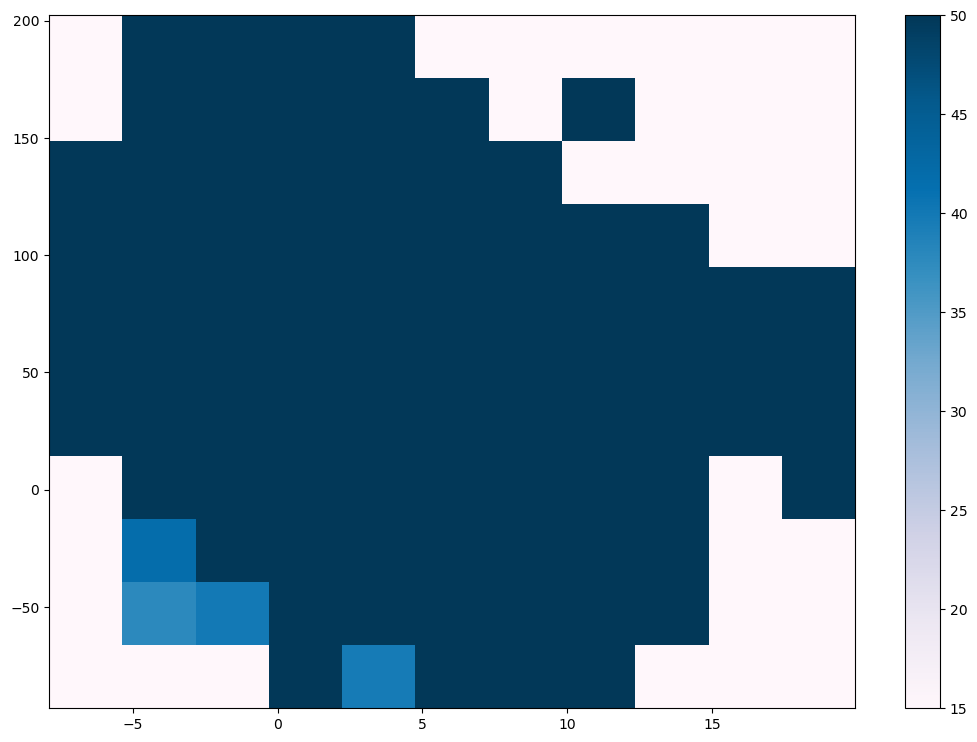

In [243]:
from scipy.stats import binned_statistic_2d
import numpy as np
import matplotlib.pyplot as plt

dat=lafut

y = dat['area_10mm']
x = dat['sh_1deg']
z = dat['tcwv_1deg']

mask = np.isfinite(y) & np.isfinite(x) & np.isfinite(z)
y = y[mask]
x = x[mask]
z = z[mask]

q_perc = np.percentile(x, [1,99])
shear_perc = np.percentile(z, [1,99])
  
tbin = np.linspace(q_perc[0], q_perc[1], 12)  # qbins
sbin = np.linspace(shear_perc[0],shear_perc[1] , 12) # shearbins
plotbins = [sbin,tbin]

## example functions
func1 = lambda y: np.mean(y)                                                  # mean max precip
func2 = lambda y: np.percentile(y,95, interpolation='nearest') # p95 max precip
func3 = lambda y: np.sum(np.isfinite(y))                                  # valid count
func4 = lambda y: np.sum(y>10)                                             # rain threshold frequency

ret = binned_statistic_2d(z, x, y, statistic=func1, bins=plotbins)
count = binned_statistic_2d(z,x, y, statistic=func3, bins=plotbins)
thresh = binned_statistic_2d(z, x, y, statistic=func4, bins=plotbins)
   
to_plot=ret.statistic.T
valid = count.statistic.T
to_plot[valid<5] = 0    # minimum 5 storms


f= plt.figure(figsize=(13,9), dpi=100)
ax = f.add_subplot(111)

mp = plt.pcolormesh(plotbins[0], plotbins[1], to_plot, cmap='PuBu', vmin=15, vmax=50)
plt.colorbar(mp)

pmax
sh_1deg
tcwv_1deg
pmax
sh_1deg
tcwv_1deg


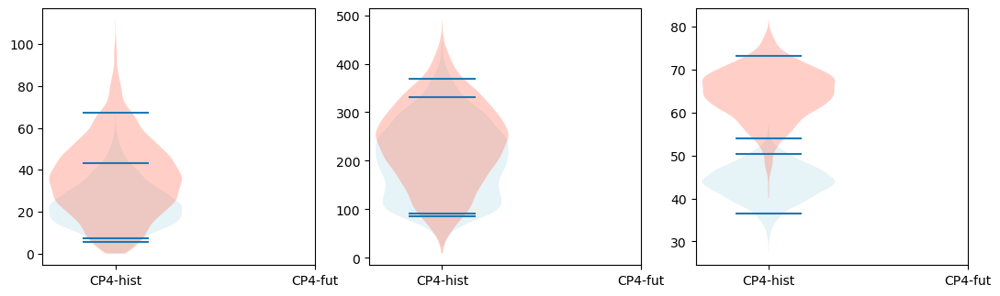

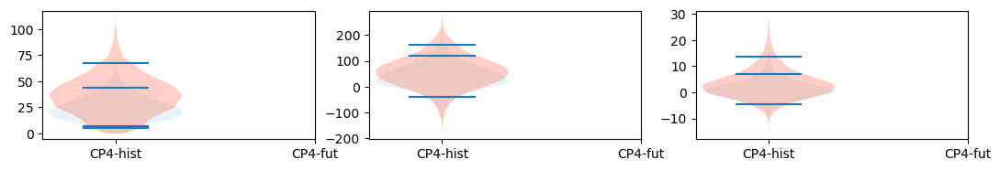

In [28]:
f= plt.figure(figsize=(13,8), dpi=100)
for idx, v in enumerate(['pmax', 'sh_1deg', 'tcwv_1deg']):

    dat1=lhist[v].dropna()
    dat2 = lfut[v].dropna()
    
    data = [dat1, dat2]
    print(v)
    
   # ipdb.set_trace()

    labels = ['CP4-hist', 'CP4-fut']
    
    bpos = np.linspace(0.25,1,len(labels))

    ax = f.add_subplot(2,3,idx+1)
    parts = ax.violinplot(data, positions=[0.25,0.25], showmeans=False, showextrema=False, quantiles=[[0.05,0.95], [0.05,0.95]]) # positions=bpos, whis=[10,90], patch_artist=True, widths=0.1, sym='.', medianprops=dict(color='k'), flierprops=dict(markersize=1)#
    
    (parts['bodies'][0]).set_facecolor('lightblue')
    (parts['bodies'][1]).set_facecolor('tomato')

    (parts['cquantiles']).set_facecolor('k')
    #(parts['cquantiles'][1]).set_facecolor('red')
    
    ax.set_xticks([0.25,1], labels=labels)
    
f= plt.figure(figsize=(13,4), dpi=100)
for idx, v in enumerate(['pmax', 'sh_1deg', 'tcwv_1deg']):

    dat1=lahist[v].dropna()
    dat2 = lafut[v].dropna()
    
    data = [dat1, dat2]
    print(v)
    
   # ipdb.set_trace()

    labels = ['CP4-hist', 'CP4-fut']
    
    bpos = np.linspace(0.25,1,len(labels))

    ax = f.add_subplot(2,3,idx+4)
    parts = ax.violinplot(data, positions=[0.25,0.25], showmeans=False, showextrema=False, quantiles=[[0.05,0.95], [0.05,0.95]]) # positions=bpos, whis=[10,90], patch_artist=True, widths=0.1, sym='.', medianprops=dict(color='k'), flierprops=dict(markersize=1)#
    
    (parts['bodies'][0]).set_facecolor('lightblue')
    (parts['bodies'][1]).set_facecolor('tomato')

    (parts['cquantiles']).set_facecolor('k')
    #(parts['cquantiles'][1]).set_facecolor('red')
    
    ax.set_xticks([0.25,1], labels=labels)

q_srfc_1deg 4.79080640117091 0.13628927602074015
tcwv_1deg 20.823332373570807 2.2133955719542446
t_srfc_1deg 5.979783376563013 0.3321482763102006
lh_1deg -55.258927694893146 -37.7291948918035
sh_1deg 23.107047475655605 20.125745994178352
theta 6.143395672932186 0.4170145606398663
theta-e 17.97290378357279 0.48379617932426067


<BarContainer object of 7 artists>

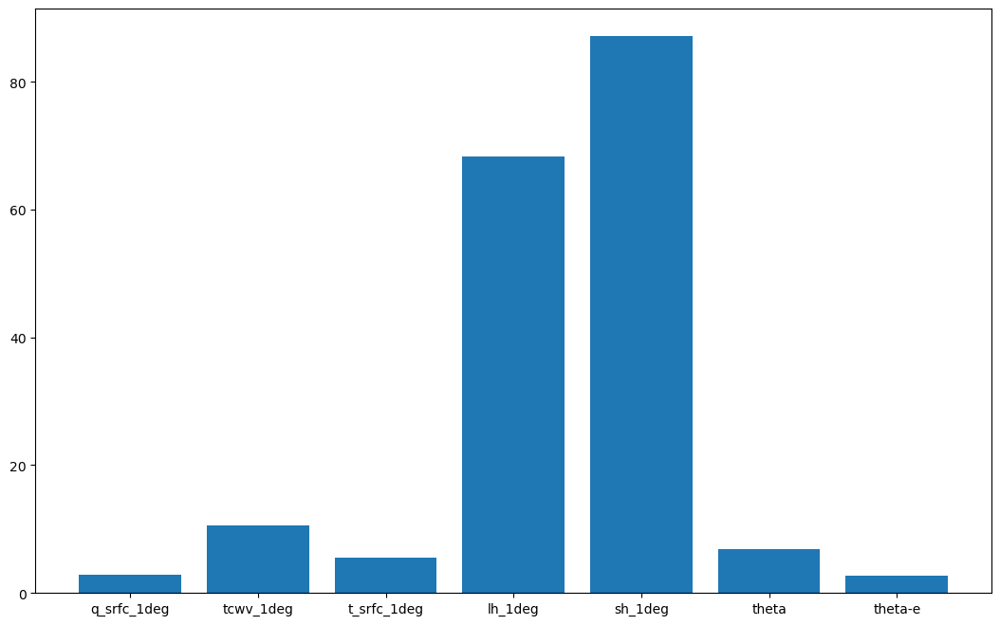

In [242]:
f= plt.figure(figsize=(13,8), dpi=100)
collect = []
varts = ['q_srfc_1deg', 'tcwv_1deg', 't_srfc_1deg', 'lh_1deg', 'sh_1deg', 'theta', 'theta-e']
for idx, v in enumerate(varts):
    efhist = lhist['EF']<0.75
    effut = lfut['EF']<0.75
    climhist=np.nanmean((lhist[v])[efhist].dropna())
    climfut= np.nanmean((lfut[v])[effut].dropna())
    
    anohist = np.mean(lahist[v].dropna())
    anofut= np.mean(lafut[v].dropna())
    
    print(v, climfut-climhist, anofut-anohist)
    

    
    
    anomcont = (anofut-anohist)/(climfut-climhist)*100
    
    collect.append(anomcont)
#ipdb.set_trace()

plt.bar(np.arange(len(varts)), height=collect, tick_label=varts)